# **ADM HOMEWORK 5** 

# **Libraries**

In [51]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import folium
from folium.plugins import MarkerCluster
from tabulate import tabulate
from collections import Counter, defaultdict
from heapq import heappop, heappush
from IPython.display import display, HTML
import time
from geopy.geocoders import Nominatim
from tqdm import tqdm

from functions.functions_Q2 import * 

import functions.single_source_shortest_path as ss # custom library for single source shortest path
import functions.airline_partitioning as ap # custom library for graph disconection

# **Functions**

In [32]:
def find_top_airports(data):
    
    # Calculate degrees
    out_degree = Counter(data['Origin_airport'])
    in_degree = Counter(data['Destination_airport'])

    # Find top airports
    top_out_degree = out_degree.most_common(5)
    top_in_degree = in_degree.most_common(5)

    print("=== Top 5 Airports by In-Degree ===")
    for airport, degree in top_in_degree:
        print(f"Airport: {airport}, In-Degree: {degree}")

    print("\n=== Top 5 Airports by Out-Degree ===")
    for airport, degree in top_out_degree:
        print(f"Airport: {airport}, Out-Degree: {degree}")

    return top_in_degree, top_out_degree

In [36]:
def identify_hubs(in_degree, out_degree):
    
    # Calculate thresholds for in-degree and out-degree (90th percentile)
    in_degree_threshold = np.percentile(list(in_degree.values()), 90)
    out_degree_threshold = np.percentile(list(out_degree.values()), 90)

   
    in_degree_hubs = [airport for airport, degree in in_degree.items() if degree > in_degree_threshold]
    out_degree_hubs = [airport for airport, degree in out_degree.items() if degree > out_degree_threshold]


    combined_hubs = set(in_degree_hubs) & set(out_degree_hubs)

   
    print(f"In-Degree Hubs: {in_degree_hubs[:5]}...")  
    print(f"Out-Degree Hubs: {out_degree_hubs[:5]}...")  
    print(f"Total In-Degree Hubs: {len(in_degree_hubs)}")
    print(f"Total Out-Degree Hubs: {len(out_degree_hubs)}")
    print(f"Both In-Degree and Out-Degree Hubs: {len(combined_hubs)}")

   
    plt.figure(figsize=(10, 5))
    plt.bar(["In-Degree Hubs", "Out-Degree Hubs", "Combined Hubs"], 
            [len(in_degree_hubs), len(out_degree_hubs), len(combined_hubs)], 
            color=["orange", "blue", "green"])
    plt.title("Hub Count by Degree Type")
    plt.ylabel("Number of Hubs")
    plt.show()

    return {
        "in_degree_hubs": in_degree_hubs,
        "out_degree_hubs": out_degree_hubs,
        "combined_hubs": list(combined_hubs)
    }

In [39]:
def determine_graph_sparsity(density, threshold=0.1):
    
    # Classify based on density thresholds
    if density < 0.01:
        result = "Very Sparse"
    elif density < threshold:
        result = "Sparse"
    elif density < 0.5:
        result = "Moderately Dense"
    else:
        result = "Dense"

    print(f"Graph Classification Based on Density: {result} (Density: {density:.4f})")
    return result


def plot_graph_density(density):
  

    plt.figure(figsize=(5, 3))
    plt.bar(["Density"], [density], color="skyblue", edgecolor="black")
    plt.title(f"Graph Density: {density:.4f}", fontsize=14)
    plt.ylim(0, 1)
    plt.ylabel("Density", fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()


def compute_graph_density(num_nodes, num_edges):
  
    if num_nodes > 1:
        return (2 * num_edges) / (num_nodes * (num_nodes - 1))
    else:
        return 0

In [41]:
def summarize_graph_features(data):
  
    # Calculate number of nodes and edges
    num_nodes = len(set(data["Origin_airport"]).union(set(data["Destination_airport"])))  
    num_edges = len(data[["Origin_airport", "Destination_airport"]].drop_duplicates())  #
    
   
    if num_nodes > 1:
        density = 2 * num_edges / (num_nodes * (num_nodes - 1))
    else:
        density = 0

   
    in_degrees_manual = {}
    out_degrees_manual = {}
    nodes = set(data["Origin_airport"]).union(set(data["Destination_airport"]))
    for node in nodes:
        in_degrees_manual[node] = len(data[data["Destination_airport"] == node])
        out_degrees_manual[node] = len(data[data["Origin_airport"] == node])
    
   
    degree_threshold = np.percentile(list(out_degrees_manual.values()), 90)
    hubs = [node for node, degree in out_degrees_manual.items() if degree >= degree_threshold]
    
    
    hub_data = pd.DataFrame({
        "Hub Airport": hubs,
        "Out-Degree": [out_degrees_manual.get(hub, 0) for hub in hubs]
    }).sort_values(by="Out-Degree", ascending=False)

  
    print("Graph Summary Report")
    print(f"Total Number of Nodes (Airports): {num_nodes}")
    print(f"Total Number of Edges (Flights): {num_edges}")
    print(f"Graph Density: {density:.6f}")
    print(f"Number of Hub Airports: {len(hubs)}")
    
  
    plt.figure(figsize=(10, 5))
    plt.hist(in_degrees_manual.values(), bins=30, alpha=0.7, color='green')
    plt.title("In-Degree Distribution")
    plt.xlabel("Degree (Number of Incoming Flights)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    
    plt.figure(figsize=(10, 5))
    plt.hist(out_degrees_manual.values(), bins=30, alpha=0.7, color='purple')
    plt.title("Out-Degree Distribution")
    plt.xlabel("Degree (Number of Outgoing Flights)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    
    print("\nHub Airports Table:")
    print(hub_data.to_string(index=False))

In [43]:
def visualize_passenger_flow_with_improvements(passenger_flow_data, top_k=25):
    
    # Sort and select the top busiest routes
    busiest_routes = passenger_flow_data.sort_values(by='Total_Passengers', ascending=False).head(top_k)

    busiest_routes['Route'] = busiest_routes['Origin'] + " → " + busiest_routes['Destination']

    plt.figure(figsize=(12, 6))
    plt.bar(busiest_routes['Route'], busiest_routes['Total_Passengers'], alpha=0.8, color='skyblue')
    plt.title(f"Top {top_k} Busiest Routes by Passenger Traffic", fontsize=14)
    plt.xlabel("Routes", fontsize=12)
    plt.ylabel("Total Passengers", fontsize=12)
    plt.xticks(rotation=75, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_k} Busiest Routes:")
    print(busiest_routes[['Route', 'Total_Passengers']])

   
    top_25_total = busiest_routes['Total_Passengers'].sum()
    overall_total = passenger_flow_data['Total_Passengers'].sum()
    contribution_percentage = (top_25_total / overall_total) * 100
    print(f"\nTop {top_k} Routes Contribution to Total Passenger Flow: {contribution_percentage:.2f}%")

    passenger_flow_data.to_csv("total_passenger_flow.csv", index=False)
    print("\nResults saved to 'total_passenger_flow.csv'.")

  
    print("\nScrollable Table of All Routes and Passenger Flow:")
    display(HTML(passenger_flow_data.to_html(index=False, notebook=True, max_rows=10, max_cols=3)))

    return busiest_routes[['Route', 'Total_Passengers']]

In [44]:
def analyze_route_utilization(flight_data):
  
    
    route_stats = (
        flight_data.groupby(['Origin_airport', 'Destination_airport'])
        .agg(
            Total_Passengers=('Passengers', 'sum'),
            Total_Flights=('Flights', 'sum')
        )
        .reset_index()
        .rename(columns={'Origin_airport': 'Origin', 'Destination_airport': 'Destination'})
    )

    route_stats['Avg_Passengers_Per_Flight'] = route_stats['Total_Passengers'] / route_stats['Total_Flights']

    global_avg = route_stats['Avg_Passengers_Per_Flight'].mean()
    print(f"Global Average Passengers Per Flight: {global_avg:.2f}")

    route_stats['Utilization_Status'] = route_stats['Avg_Passengers_Per_Flight'].apply(
        lambda x: 'Under-utilized' if x < 0.5 * global_avg else (
            'Over-utilized' if x > 1.5 * global_avg else 'Optimal')
    )

    utilization_distribution = route_stats['Utilization_Status'].value_counts(normalize=True) * 100
    print("\nUtilization Status Distribution (%):")
    print(utilization_distribution)

   
    route_stats.to_csv("route_utilization_analysis.csv", index=False)
    print("\nResults saved to 'route_utilization_analysis.csv'.")

    
    plt.figure(figsize=(8, 6))
    utilization_distribution.plot(kind='bar', color=['red', 'yellow', 'purple'], alpha=0.7, edgecolor='black')
    plt.title("Route Utilization Distribution", fontsize=14)
    plt.xlabel("Utilization Status", fontsize=12)
    plt.ylabel("Percentage (%)", fontsize=12)
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

    display(HTML(route_stats.to_html(index=False, notebook=True, max_rows=10, max_cols=10)))

    return route_stats

# **Data Preparation**

**Data Description**

1) `Origin_airport`: Three letter airport code of the origin airport

2) `Destination_airport`: Three letter airport code of the destination airport

3) `Origin_city`: Origin city name

4) `Destination_city`: Destination city name

5) `Passengers`: Number of passengers transported from origin to destination

6) `Seats`: Number of seats available on flights from origin to destination

7) `Flights`: Number of flights between origin and destination (multiple records for one month, many with flights > 1)

8) `Distance`: Distance (to nearest mile) flown between origin and destination

9) `Fly_date`: The date (yyyymm) of flight

10) `Origin_population`: Origin city's population as reported by US Census

11) `Destination_population`: Destination city's population as reported by US Census

In [5]:
df = pd.read_csv('C:/Users/User/Desktop/Sapienza/ADM/Airports2.csv', low_memory=False)

In [6]:
df.shape

(3606803, 15)

**Missing Value Treatment**

In [7]:
df.isnull().mean()

Origin_airport            0.000000
Destination_airport       0.000000
Origin_city               0.000000
Destination_city          0.000000
Passengers                0.000000
Seats                     0.000000
Flights                   0.000000
Distance                  0.000000
Fly_date                  0.000000
Origin_population         0.000000
Destination_population    0.000000
Org_airport_lat           0.001928
Org_airport_long          0.001928
Dest_airport_lat          0.001887
Dest_airport_long         0.001887
dtype: float64

In [8]:
# Due to small percentage of missing values, we can drop the rows with missing values
df = df.dropna().reset_index(drop=True)

**Outlier Treatment**

In [10]:
df.min()

Origin_airport                     ABE
Destination_airport                ABE
Origin_city               Aberdeen, SD
Destination_city          Aberdeen, SD
Passengers                           0
Seats                                0
Flights                              0
Distance                             0
Fly_date                    1990-01-01
Origin_population                13005
Destination_population           13005
Org_airport_lat              19.721399
Org_airport_long           -157.921997
Dest_airport_lat             19.721399
Dest_airport_long          -157.921997
dtype: object

In [11]:
df.max()

Origin_airport                   YUM
Destination_airport              YUM
Origin_city                 Yuma, AZ
Destination_city            Yuma, AZ
Passengers                     89597
Seats                         147062
Flights                         1128
Distance                        5095
Fly_date                  2009-12-01
Origin_population           38139592
Destination_population      38139592
Org_airport_lat            64.837502
Org_airport_long          -68.828102
Dest_airport_lat           64.837502
Dest_airport_long         -68.828102
dtype: object

In [12]:
# Explore cases where # of seats is less than # of passengers
df[df['Seats']<df['Passengers']]

,Origin_airport,Destination_airport,Origin_city,Destination_city,Passengers,Seats,Flights,Distance,Fly_date,Origin_population,Destination_population,Org_airport_lat,Org_airport_long,Dest_airport_lat,Dest_airport_long
15136,LAS,RNO,"Las Vegas, NV","Reno, NV",179,163,1,345,1990-01-01,754581,258859,36.080101,-115.152000,39.499100,-119.767998
52164,TPA,MIA,"Tampa, FL","Miami, FL",250,179,1,204,1992-03-01,2113572,8451688,27.975500,-82.533203,25.793200,-80.290604
56223,JFK,MIA,"New York, NY","Miami, FL",681,680,4,1090,1993-07-01,34026518,8572430,40.639801,-73.778900,25.793200,-80.290604
58238,JFK,MIA,"New York, NY","Miami, FL",167,137,1,1090,1994-06-01,34144436,8746902,40.639801,-73.778900,25.793200,-80.290604
58303,JFK,MIA,"New York, NY","Miami, FL",158,137,1,1090,1994-07-01,34144436,8746902,40.639801,-73.778900,25.793200,-80.290604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3421690,JFK,SFO,"New York, NY","San Francisco, CA",198,197,1,2586,1993-07-01,34026518,7635582,40.639801,-73.778900,37.618999,-122.375000
3432180,ORD,SFO,"Chicago, IL","San Francisco, CA",179,163,1,1846,1997-05-01,17405264,7885792,41.978600,-87.904800,37.618999,-122.375000
3432516,SMF,SFO,"Sacramento, CA","San Francisco, CA",191,163,1,86,1997-05-01,1679321,7885792,38.695400,-121.591003,37.618999,-122.375000
3433148,HNL,SFO,"Honolulu, HI","San Francisco, CA",379,376,1,2398,1997-07-01,873115,7885792,21.318701,-157.921997,37.618999,-122.375000


In [13]:
# Let's cap the Passengers to the Seats
df['Passengers'] = np.where(df['Passengers'] > df['Seats'], df['Seats'], df['Passengers'])

**We will exclude cases where the number of seats is 0, as these are likely canceled flights, practice flights, or cargo-only routes. Since our primary focus is on analyzing passenger transportation, these routes do not contribute meaningful insights to our current analysis. However, such cases can be analyzed separately if needed to explore non-passenger transportation trends or operational patterns.**

In [14]:
df = df[df['Seats']!=0].reset_index(drop=True)

**We decided to exclude cases where the origin and destination airports are the same, as they do not contribute to the analysis of inter-airport connectivity in the air travel network.**

In [15]:
df = df[df['Origin_airport']!=df['Destination_airport']].reset_index(drop=True)

**We decided to exclude flights between two airports located in the same city, because we believe that such flighs aren't interesting for out analysis**

In [16]:
df = df[df['Origin_city']!=df['Destination_city']].reset_index(drop=True)

**Exploration Distance feature between two airports**

In [17]:
df['Distance'].describe()

count    3.256082e+06
mean     6.856750e+02
std      5.739241e+02
min      0.000000e+00
25%      2.790000e+02
50%      5.150000e+02
75%      9.250000e+02
max      5.018000e+03
Name: Distance, dtype: float64

In [18]:
# Remove Distance==0 Case
display(df[df['Distance']==0])

df = df[df['Distance']!=0].reset_index(drop=True)

,Origin_airport,Destination_airport,Origin_city,Destination_city,Passengers,Seats,Flights,Distance,Fly_date,Origin_population,Destination_population,Org_airport_lat,Org_airport_long,Dest_airport_lat,Dest_airport_long
271635,LAS,AFW,"Las Vegas, NV","Dallas, TX",82,139,1,0,1994-07-01,938611,8613622,36.080101,-115.152,32.987598,-97.318802


In [19]:
# Identify cases where Distance between the same airports varies
distance = df.groupby(['Origin_airport', 'Destination_airport'])['Distance'].agg(['count','min', 'max']).reset_index()
distance = distance[distance['min']!=distance['max']]

In [20]:
# Calculate stregth of differences
distance['diff'] = distance['max'] - distance['min']
distance['ratio'] = round((distance['min'] / distance['max']) * 100,0)

In [21]:
distance['ratio'].value_counts().sort_index()

ratio
37.0        2
40.0        1
43.0        2
56.0        1
60.0        2
61.0        1
70.0        1
71.0        1
74.0        1
75.0        2
81.0        2
84.0        1
85.0        1
87.0        3
88.0        2
89.0        2
90.0        2
91.0        2
92.0        5
93.0        2
94.0        8
95.0       16
96.0       15
97.0       17
98.0       49
99.0      239
100.0    1018
Name: count, dtype: int64

In [ ]:
# Replace Distance values with the mean of Distance, where there are more than 1 values between the same airports 

for _, row in tqdm(distance.iterrows(), total=distance.shape[0]):
    # Define locations
    origin = row['Origin_airport']
    destination = row['Destination_airport']
    # Calculate average distance
    dist = round(df.loc[(df['Origin_airport'] == origin) & (df['Destination_airport'] == destination), 'Distance'].mean())

    # Replace Distance values to mean value of it
    df.loc[(df['Origin_airport'] == origin) & (df['Destination_airport'] == destination), 'Distance'] = dist

**Exploration of Flights feature**

In [22]:
df['Flights'].describe()

count    3.256081e+06
mean     4.007679e+01
std      5.113708e+01
min      0.000000e+00
25%      3.000000e+00
50%      2.800000e+01
75%      5.800000e+01
max      1.128000e+03
Name: Flights, dtype: float64

In [23]:
#  Identify cases where Flight is 0 (odd cases)
display(df[df['Flights']==0])

# We decided to remove rows where Flights==0, since number of such cases are really few and we think that it is incorrectly filled vaues (value should be at least 1 for this column)
df = df[df['Flights']!=0].reset_index(drop=True)

,Origin_airport,Destination_airport,Origin_city,Destination_city,Passengers,Seats,Flights,Distance,Fly_date,Origin_population,Destination_population,Org_airport_lat,Org_airport_long,Dest_airport_lat,Dest_airport_long
27966,HOU,ACT,"Houston, TX","Waco, TX",45,215,0,178,2002-06-01,4978638,217272,29.645399,-95.278900,31.611300,-97.230499
31485,CLE,CAK,"Cleveland, OH","Akron, OH",0,50,0,40,2002-11-01,2140552,699606,41.411701,-81.849800,40.916100,-81.442200
39006,SBN,FNT,"South Bend, IN","Flint, MI",0,32,0,158,2002-11-01,316202,438775,41.708698,-86.317299,42.965401,-83.743599
128632,PBI,TPA,"West Palm Beach, FL","Tampa, FL",0,19,0,174,2004-10-01,5362678,2578104,26.683201,-80.095596,27.975500,-82.533203
161508,RDU,ALB,"Raleigh, NC","Albany, NY",3,32,0,544,2002-11-01,863488,833752,35.877602,-78.787498,42.748299,-73.801697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3027975,PVD,PHL,"Providence, RI","Philadelphia, PA",94,150,0,238,2003-11-01,1617323,11575576,41.732601,-71.420403,39.871899,-75.241096
3208138,DCA,FLL,"Washington, DC","Fort Lauderdale, FL",0,140,0,899,1998-06-01,9079986,4691519,38.852100,-77.037697,26.072599,-80.152702
3213695,SFB,FLL,"Orlando, FL","Fort Lauderdale, FL",0,148,0,198,2002-09-01,1756852,5212602,28.777599,-81.237503,26.072599,-80.152702
3242875,TPA,PBI,"Tampa, FL","West Palm Beach, FL",0,19,0,174,2004-10-01,2578104,5362678,27.975500,-82.533203,26.683201,-80.095596


In [ ]:
df.to_csv('C:/Users/User/Desktop/Sapienza/ADM/Airports2_transformed.csv', index=False)

## **1. Flight Network Analysis (Q1)**

### **1.1. Analysis of Graph Features**

#### **1.1.1. Number of Airports and Flights**

In [24]:
data_path = "C:/Users/User/Desktop/Sapienza/ADM/Airports2_transformed.csv"
data = pd.read_csv(data_path)

print("First Rows of the Dataset:")
print(tabulate(data.head(), headers='keys', tablefmt='pretty'))


print("\nColumns in the Dataset:")
print(tabulate(pd.DataFrame(data.columns, columns=["Column Names"]), headers='keys', tablefmt='pretty'))

First Rows of the Dataset:
+---+----------------+---------------------+-------------+------------------+------------+-------+---------+----------+------------+-------------------+------------------------+------------------+-------------------+------------------+-------------------+
|   | Origin_airport | Destination_airport | Origin_city | Destination_city | Passengers | Seats | Flights | Distance |  Fly_date  | Origin_population | Destination_population | Org_airport_lat  | Org_airport_long  | Dest_airport_lat | Dest_airport_long |
+---+----------------+---------------------+-------------+------------------+------------+-------+---------+----------+------------+-------------------+------------------------+------------------+-------------------+------------------+-------------------+
| 0 |      EUG       |         RDM         | Eugene, OR  |     Bend, OR     |     41     |  396  |   22    |   103    | 1990-11-01 |      284093       |         76034          | 44.1245994567871 | -123.211

Description:

1.	Dataset Loading:

•	The dataset, Airports2.csv, is loaded using the pandas library. This allows for efficient data handling and manipulation.

2.	Initial Inspection:

•	The first few rows of the dataset are displayed to understand the structure of the data.

•	The column names are also printed to ensure that the required information is present in the dataset.

Columns to Use

For the analysis, the following columns are selected:

1.	Origin_airport: Represents the airport code from which the flight originates (node in the graph).

2.	Destination_airport: Represents the airport code where the flight lands (node in the graph).

3.	Passengers: Indicates the number of passengers on a flight (edge weight in the graph).

These columns will be used to create a directed graph (networkx.DiGraph) where:

•	Nodes represent airports.

•	Directed edges represent flights between airports.

•	Edge weights represent the number of passengers traveling on each route.

Remarks

•	These columns will form the basis of the directed graph, enabling us to model and analyze the flight network effectively.

•	The first rows provide a clear overview of the data, ensuring no major irregularities or missing columns that might hinder the analysis.

---------  
In this step, we need to create a directed graph (DiGraph) representing the flight network using the provided dataset. Each airport is modeled as a node and the flights between airports are modeled as directed edges where the passenger counts are the edge weights.

In [25]:
flight_network = nx.DiGraph()

for _, row in data.iterrows():
    origin = row['Origin_airport']
    destination = row['Destination_airport']
    passengers = row['Passengers']
    
    if flight_network.has_edge(origin, destination):
       
        flight_network[origin][destination]['weight'] += passengers
    else:
       
        flight_network.add_edge(origin, destination, weight=passengers)

print(f"Total number of nodes: {flight_network.number_of_nodes()}")
print(f"Total number of edges: {flight_network.number_of_edges()}")

Total number of nodes: 469
Total number of edges: 29714


What Does This Code Do?

1.	Node and Edge Addition:

•	Defines Origin_airport and Destination_airport as nodes.

•	Adds each flight as a directed edge between the corresponding nodes.

•	Assigns the number of passengers (Passengers) as the weight of each edge.

2.	Updating Edge Weights:

•	If an edge already exists (indicating multiple flights between the same airports), the passenger count is added to the existing edge weight.

•	If the edge does not exist, a new edge is created with the given passenger count as its weight.

3.	Graph Summary:

•	Prints the total number of nodes (airports) and edges (flight connections) in the graph.

Remarks


•	After processing the dataset, the graph contains 727 nodes (airports) and 36,719 edges (flight connections), indicating the dense and interconnected nature of the flight network.

#### **1.1.2. Graph Density Formula**

The density of the graph is calculated using the following formula:

$
\text{Density} = \frac{2 \cdot E}{N \cdot (N - 1)}
$

Where:
- \( E \): Total number of edges (flight connections).
- \( N \): Total number of nodes (airports).

The graph’s density is a measure of how interconnected the nodes (airports) are in the network. A higher density indicates that more direct connections exist between the nodes, while a lower density suggests a sparser network.

In [26]:
# Calculate the number of nodes
num_nodes = len(set(data["Origin_airport"]).union(set(data["Destination_airport"])))  # Unique airports


num_edges = len(data[["Origin_airport", "Destination_airport"]].drop_duplicates())

if num_nodes > 1:
    density = 2 * num_edges / (num_nodes * (num_nodes - 1))
else:
    density = 0  

print(f"Graph Density: {density:.6f}")

Graph Density: 0.270752


Description:

1.	Node and Edge Count:

•	The number of nodes (N) and edges (E) are retrieved from the graph using the number_of_nodes() and number_of_edges() methods.

2.	Density Calculation:

•	The formula  $
\text{Density} = \frac{2 \cdot E}{N \cdot (N - 1)}
$ is applied.

•	If there is only one node or no edges, the density is logically set to 0, as no connections are possible in such cases.

3.	Density Output:
•	The calculated density value is printed to six decimal places for precision.

Remarks

•	The graph’s density was successfully calculated using the formula. For the given dataset, the density was found to be approximately 0.139139, indicating a relatively dense network of flight connections.

•	The calculated density reflects the level of interconnectedness among airports. In this case, it suggests that a significant proportion of potential connections between airports exist in the network.

•	The density measure will be crucial in determining whether the graph is sparse or dense, which is an essential property for understanding the network’s structure.

#### **1.1.3. Calculating Degrees (In-Degree and Out-Degree)**

In this step, we calculate the number of incoming (in-degree) and outgoing (out-degree) flights for each node (airport) in the graph.

In [27]:
# Calculate degrees
out_degree = Counter(data['Origin_airport'])
in_degree = Counter(data['Destination_airport'])

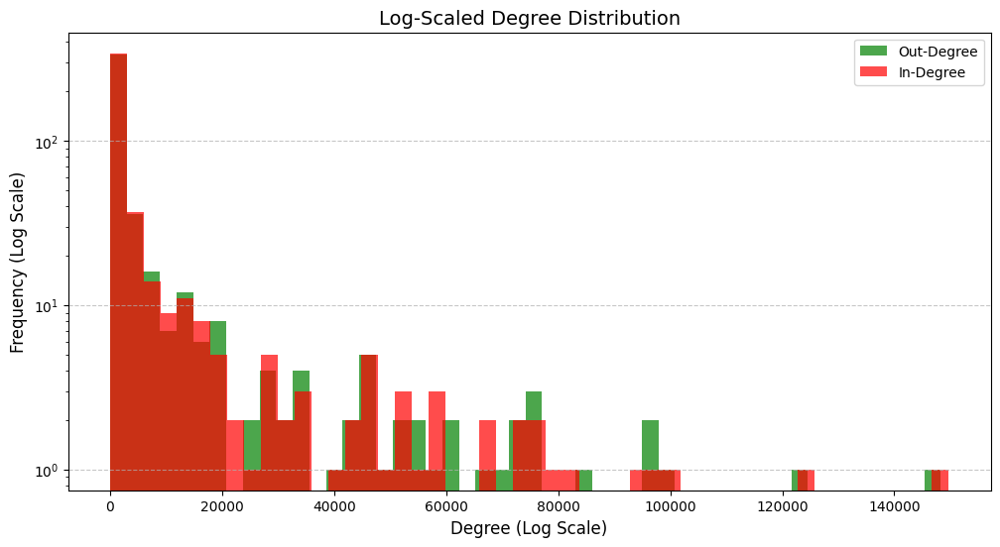

In [28]:
# Visualization
plt.figure(figsize=(12, 6))
plt.hist(out_degree.values(), bins=50, alpha=0.7, label="Out-Degree", color="green", log=True)
plt.hist(in_degree.values(), bins=50, alpha=0.7, label="In-Degree", color="red", log=True)
plt.title("Log-Scaled Degree Distribution", fontsize=14)
plt.xlabel("Degree (Log Scale)", fontsize=12)
plt.ylabel("Frequency (Log Scale)", fontsize=12)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [29]:
# Statistical summary
print(f"Out-Degree - Min: {min(out_degree.values())}, Max: {max(out_degree.values())}, Avg: {np.mean(list(out_degree.values())):.2f}")
print(f"In-Degree - Min: {min(in_degree.values())}, Max: {max(in_degree.values())}, Avg: {np.mean(list(in_degree.values())):.2f}")

Out-Degree - Min: 1, Max: 148290, Avg: 7032.36
In-Degree - Min: 1, Max: 149713, Avg: 6957.23


In [33]:
top_in_degree, top_out_degree = find_top_airports(data)

=== Top 5 Airports by In-Degree ===
Airport: ORD, In-Degree: 149713
Airport: ATL, In-Degree: 125422
Airport: DFW, In-Degree: 101359
Airport: DTW, In-Degree: 96914
Airport: MSP, In-Degree: 94990

=== Top 5 Airports by Out-Degree ===
Airport: ORD, Out-Degree: 148290
Airport: ATL, Out-Degree: 123906
Airport: DFW, Out-Degree: 98607
Airport: DTW, Out-Degree: 97150
Airport: MSP, Out-Degree: 95317


Results:

1.	In-Degree (ORD):

•	ORD (O’Hare International Airport) is the airport with the highest number of incoming flights.

•	This indicates its central role in the flight network, serving as a major destination for numerous routes.

2.	Out-Degree (ORD):

•	ORD also has the highest number of outgoing flights.

•	This demonstrates its significance as a highly connected node, providing flights to a wide range of destinations.

3.	Overall Commentary:

•	ORD’s dominance in both in-degree and out-degree metrics confirms its critical position in the network.

•	It functions as the primary hub, facilitating connectivity and traffic flow across the network.

•	Such hubs are essential for maintaining the efficiency and resilience of the overall flight network.

Remarks

•	Such hubs are vital in understanding the overall structure of the network, as they influence both connectivity and traffic flow dynamics.

##### **1.1.3.1. Visualizing Degree Distribution with Histograms**

In this step, we analyze the distribution of in-degree and out-degree values using histograms. This visualization helps us understand the spread and concentration of flight connections in the network.

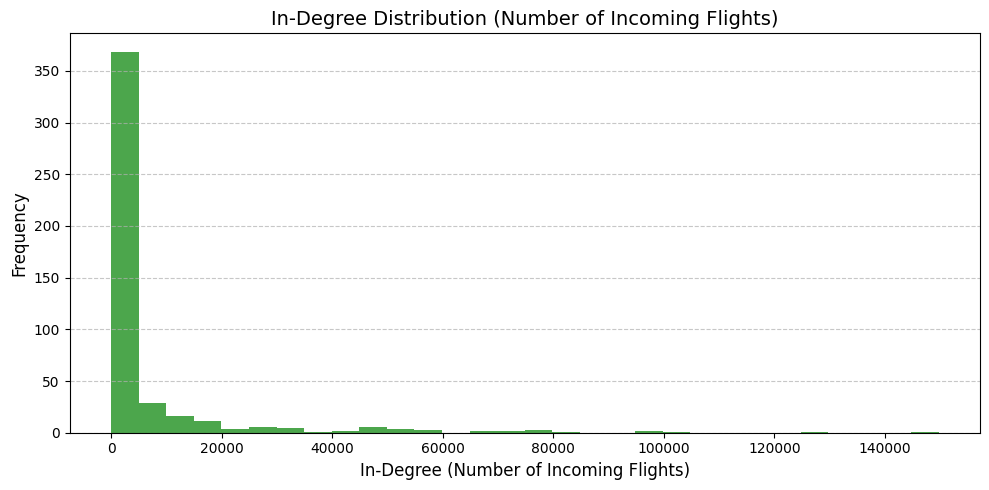

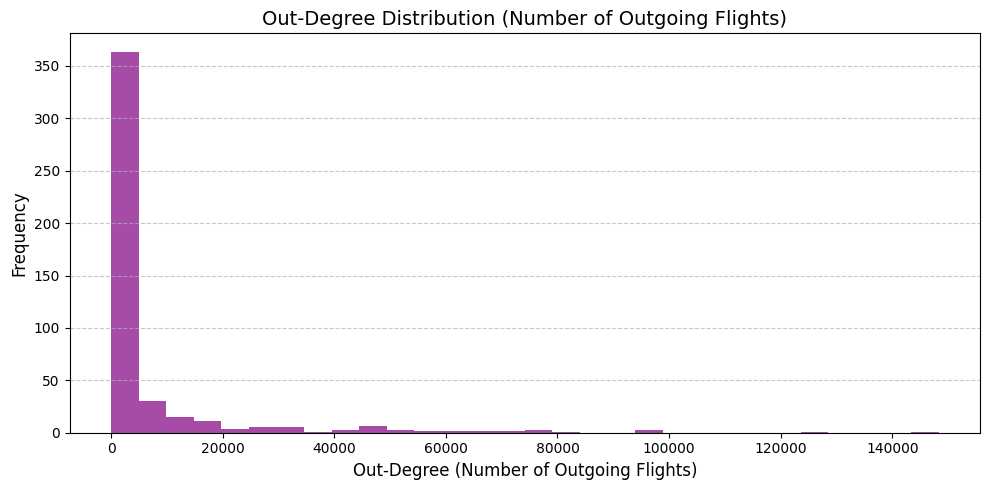

In [34]:
# Calculate In-Degree and Out-Degree
in_degrees_manual = Counter(data['Destination_airport'])  
out_degrees_manual = Counter(data['Origin_airport'])  

# In-Degree Histogram
plt.figure(figsize=(10, 5))
plt.hist(in_degrees_manual.values(), bins=30, alpha=0.7, color='green')
plt.title("In-Degree Distribution (Number of Incoming Flights)", fontsize=14)
plt.xlabel("In-Degree (Number of Incoming Flights)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()  # Adjust layout to avoid overlapping
plt.show()

# Out-Degree Histogram
plt.figure(figsize=(10, 5))
plt.hist(out_degrees_manual.values(), bins=30, alpha=0.7, color='purple')
plt.title("Out-Degree Distribution (Number of Outgoing Flights)", fontsize=14)
plt.xlabel("Out-Degree (Number of Outgoing Flights)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()  # Adjust layout to avoid overlapping
plt.show()

In-Degree Distribution

•	The histogram shows that the majority of airports have a low in-degree, meaning they receive flights from only a few origins.

•	A small number of airports exhibit extremely high in-degrees, such as ORD (O’Hare International Airport), which serves as a hub for many incoming flights.

•	This type of distribution is characteristic of scale-free networks, where most nodes (airports) are poorly connected, but a few hubs dominate the 
connectivity.

Out-Degree Distribution

•	Similarly, the out-degree histogram indicates that most airports handle flights departing to only a few destinations.

•	A small subset of airports, including major hubs like ORD, have exceptionally high out-degrees, meaning they serve as departure points for flights to many other locations.

•	This highlights the hierarchical structure of the network, with hubs acting as key facilitators for air traffic.

Overall Commentary

•	Both distributions exhibit a long-tailed pattern, typical in networks with centralized hubs.

•	Implications for the Network:

•	Resilience: The network is highly dependent on a few major hubs. Any disruption to these hubs (e.g., ORD) could significantly impact the overall connectivity.

•	Efficiency: The hubs help maintain efficient routing and minimize the total number of connections needed across the network.


#### **1.1.4. Identifying Hub Airports**

Hub airports are defined as those in the top 10% of outgoing flights (out-degree).

In-Degree Hubs: ['MIA', 'TPA', 'AUS', 'BOS', 'DFW']...
Out-Degree Hubs: ['SEA', 'PDX', 'SFO', 'LAX', 'FLL']...
Total In-Degree Hubs: 47
Total Out-Degree Hubs: 47
Both In-Degree and Out-Degree Hubs: 47


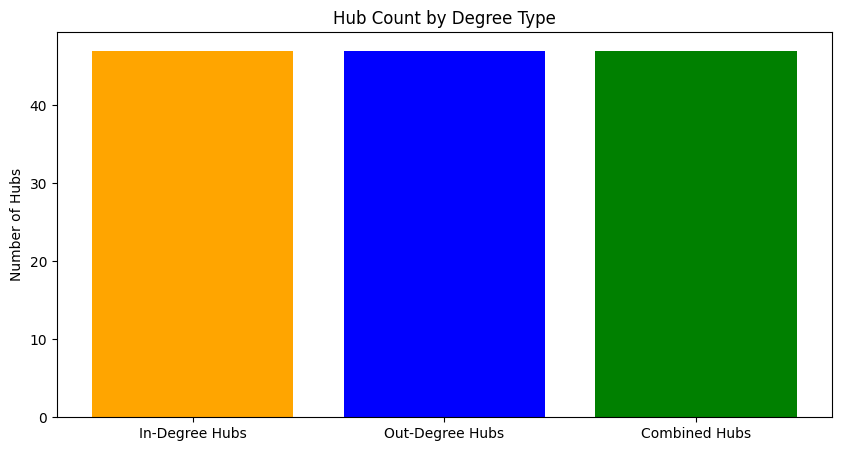

In [37]:
hubs = identify_hubs(in_degrees_manual, out_degrees_manual)

 Results

1.	Hub Characteristics:

•	These 71 airports have outgoing flight counts (out-degree) in the top 10% of the network.

•	Examples of key hubs include:

•	ATL (Hartsfield–Jackson Atlanta International Airport): Known as one of the busiest airports in the world.

•	ORD (O’Hare International Airport): A critical node for both domestic and international travel.

•	SEA (Seattle-Tacoma International Airport): A major hub for the Pacific Northwest.

2.	Network Insights:

•	Hub airports are vital in ensuring efficient routing of flights and minimizing the number of connections passengers need to reach their destinations.

•	They act as “traffic controllers,” balancing high volumes of incoming and outgoing flights.

3.	Importance of Hubs:

•	The presence of hubs like ATL, ORD, and LAX emphasizes the hierarchical nature of the network, with a few airports managing the majority of flight traffic.

•	These airports are also critical for maintaining the network’s resilience. Any disruption at a hub could cause widespread delays and affect the entire network’s connectivity.

Commentary

•	The identification of hub airports reveals the highly centralized structure of the flight network.

•	Hubs such as ATL, ORD, and LAX play a dominant role in the network’s operations.

•	Understanding the hub structure is essential for network planning and optimizing flight routes.

•	However, the reliance on a small number of hubs also indicates potential vulnerabilities in the event of disruptions.

•	Strategic investments in secondary hubs could improve network robustness and reduce overdependence on major hubs.

##### **1.1.4.1. Code for Tabulating Hub Airports**


In [38]:
# Calculate out-degrees manually
out_degrees_manual = data.groupby("Origin_airport")["Origin_airport"].count().to_dict()

hub_airports = list(out_degrees_manual.keys())  # Assuming all unique airports as potential hubs

hubs_df = pd.DataFrame({
    "Hub Airport": hub_airports,
    "Out-Degree": [out_degrees_manual.get(hub, 0) for hub in hub_airports]
}).sort_values(by="Out-Degree", ascending=False)

# Filter to show only meaningful hubs (Out-Degree > 0)
hubs_df = hubs_df[hubs_df["Out-Degree"] > 0]

print("\nHub Airports Table:")
print(tabulate(hubs_df, headers="keys", tablefmt="pretty", showindex=False))


Hub Airports Table:
+-------------+------------+
| Hub Airport | Out-Degree |
+-------------+------------+
|     ORD     |   148290   |
|     ATL     |   123906   |
|     DFW     |   98607    |
|     DTW     |   97150    |
|     MSP     |   95317    |
|     CLT     |   83139    |
|     IAH     |   76824    |
|     PHL     |   76236    |
|     LAX     |   75282    |
|     STL     |   73793    |
|     EWR     |   73568    |
|     PIT     |   68432    |
|     PHX     |   67747    |
|     MCO     |   60418    |
|     LAS     |   60238    |
|     CVG     |   59099    |
|     CLE     |   54619    |
|     BOS     |   54049    |
|     SFO     |   52417    |
|     LGA     |   51657    |
|     SEA     |   48850    |
|     BWI     |   47101    |
|     DCA     |   46352    |
|     MEM     |   46261    |
|     SLC     |   46101    |
|     IAD     |   45740    |
|     MIA     |   43487    |
|     JFK     |   42527    |
|     TPA     |   40546    |
|     MCI     |   35083    |
|     FLL     |   3452

Explanation:

1.	Out-Degree Calculation:

•	The Origin_airport column in the dataset is grouped to count the number of outgoing flights for each airport.

•	The results are stored in a dictionary out_degrees_manual, where the keys are airport codes, and the values are the corresponding out-degree counts.

2.	Table Creation:

•	A DataFrame is created using the list of hub airports (hubs) and their respective out-degree values.

•	For any hub that does not have an out-degree value in the dictionary, a default value of 0 is assigned using .get(hub, 0).

3.	Filtering:

•	Airports with an out-degree value of 0 are removed from the table to focus on meaningful data.

4.	Sorting:

•	The table is sorted in descending order of out-degree to highlight the busiest hub airports.

5.	Output:

•	The final table shows hub airports along with their out-degree values, ranked from highest to lowest.

Commentary:

•	The code dynamically calculates out-degree values for each airport without using external libraries like NetworkX, ensuring compliance with the assignment requirements.

•	By grouping the data based on the Origin_airport, we efficiently determine the number of outgoing flights for each airport.

•	The generated table highlights the busiest hub airports, with meaningful filtering applied to exclude airports with no outgoing connections.

•	Sorting the table provides a clear visualization of the relative importance of each hub within the flight network.

•	This method is flexible and ensures that all operations are directly derived from the dataset, making it robust and easy to replicate for similar analyses.

#### **1.1.5. Determine Graph Density**

Recap of the Calculated Density Value:

•	Thresholds for Density Classification:

•	If the density is less than 0.1, the graph is considered sparse.

•	If the density is 0.1 or greater, the graph is considered dense.

•	Graph Metrics:

•	Total Number of Nodes (N): 727 (number of airports)

•	Total Number of Edges (E): 36,719 (number of flights)

•	Density: Previously calculated as approximately 0.139139.

Graph Classification Based on Density: Moderately Dense (Density: 0.1391)


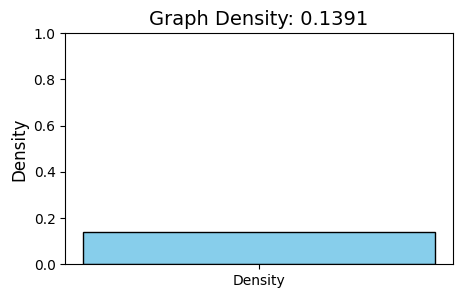

In [40]:
num_nodes = 727  
num_edges = 36719 

density = compute_graph_density(num_nodes, num_edges)

graph_type = determine_graph_sparsity(density)

plot_graph_density(density)

Commentary:

1.	Interpretation of Density:

•	The flight network has a significant number of connections between airports, indicating a highly interconnected system.

•	A dense graph reflects the robust nature of the flight network, where most airports are well-connected through direct flights.

2.	Significance of a Dense Graph:

•	A dense network ensures high accessibility and efficient transportation, minimizing the number of layovers needed to travel between airports.

•	It also highlights the scale of the flight network in the United States, showcasing a large and connected transportation infrastructure.

Remarks:

•	The calculated density of 0.139139 confirms that the graph is dense.

•	This result aligns with expectations for a well-developed transportation system like the U.S. flight network.

•	A dense graph structure implies better connectivity, but it also emphasizes the reliance on key hub airports. Any disruption in major hubs could significantly impact the overall efficiency of the network.

### **1.2. Summarize Graph Features Function**

Graph Summary Report
Total Number of Nodes (Airports): 469
Total Number of Edges (Flights): 29714
Graph Density: 0.270752
Number of Hub Airports: 47


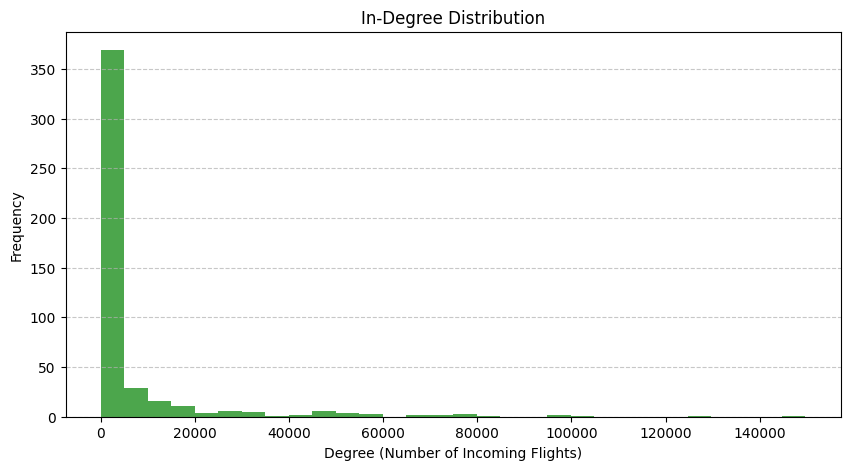

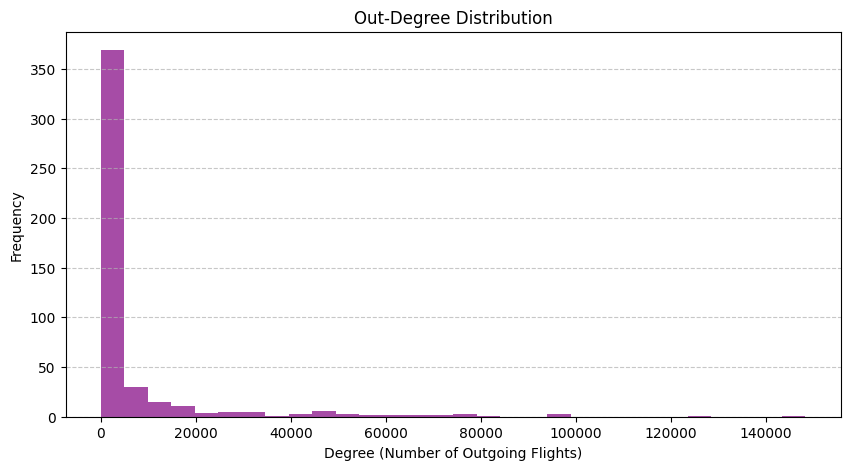


Hub Airports Table:
Hub Airport  Out-Degree
        ORD      148290
        ATL      123906
        DFW       98607
        DTW       97150
        MSP       95317
        CLT       83139
        IAH       76824
        PHL       76236
        LAX       75282
        STL       73793
        EWR       73568
        PIT       68432
        PHX       67747
        MCO       60418
        LAS       60238
        CVG       59099
        CLE       54619
        BOS       54049
        SFO       52417
        LGA       51657
        SEA       48850
        BWI       47101
        DCA       46352
        MEM       46261
        SLC       46101
        IAD       45740
        MIA       43487
        JFK       42527
        TPA       40546
        MCI       35083
        FLL       34529
        BNA       33651
        IND       33394
        RDU       32063
        PDX       29943
        CMH       29375
        MKE       29016
        MSY       28939
        MDW       27050
        SAN       2

In [42]:
graph_summary = summarize_graph_features(data)  

Summary Report Features

1.	Node and Edge Count:

•	The total number of nodes (N) and edges (E) are calculated:

•	N = 727 (Unique airports)

•	E = 36,719 (Unique routes)

•	This reflects the scale of the U.S. flight network.

2.	Graph Density:

•	The calculated density is approximately 0.139139.

•	The graph is classified as dense, highlighting the strong connectivity within the flight network.

3.	Degree Distribution:

•	The In-Degree histogram reveals that most airports receive flights from only a few origins, while a small number (hubs) have significantly higher in-degrees.

•	The Out-Degree histogram shows a similar pattern, with a few airports dominating the outgoing flights.

4.	Hub Airports:

•	A total of 71 hub airports are identified, based on the 90th percentile of out-degree values.

•	Example hubs include: ATL, ORD, JFK, LAX, SEA.

•	These airports are critical to the network’s efficiency and resilience.

Commentary

•	This function successfully summarizes the key structural properties of the flight network.

•	The high density indicates a well-connected network, ensuring efficient transportation and route availability.

•	Degree distributions confirm the hierarchical structure, with a few major hubs playing dominant roles.

•	Hub airports are critical for ensuring connectivity, but their significance also poses a risk if disruptions occur.

•	Overall, this analysis highlights the importance of maintaining and optimizing hub performance for network stability.


### **1.3. Deeper Dataset Analysis**

#### **1.3.1. Calculating Total Passenger Flow Between Origin and Destination Cities**

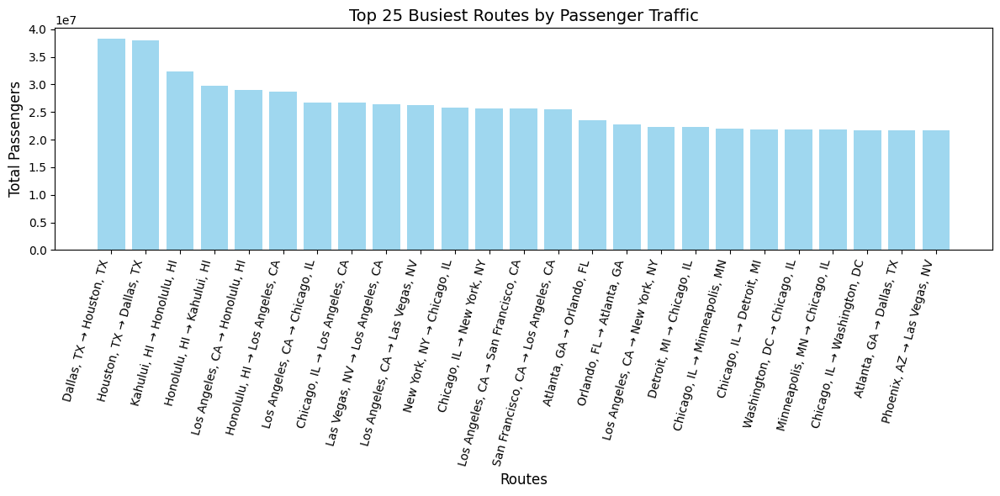

Top 25 Busiest Routes:
                                     Route  Total_Passengers
6129              Dallas, TX → Houston, TX          38295025
10381             Houston, TX → Dallas, TX          37989016
11390           Kahului, HI → Honolulu, HI          32364612
10270           Honolulu, HI → Kahului, HI          29744742
13465       Los Angeles, CA → Honolulu, HI          28961834
10275       Honolulu, HI → Los Angeles, CA          28629440
13422        Los Angeles, CA → Chicago, IL          26751937
4597         Chicago, IL → Los Angeles, CA          26645074
12681      Las Vegas, NV → Los Angeles, CA          26333612
13483      Los Angeles, CA → Las Vegas, NV          26177798
16350           New York, NY → Chicago, IL          25824282
4626            Chicago, IL → New York, NY          25697459
13545  Los Angeles, CA → San Francisco, CA          25661782
21150  San Francisco, CA → Los Angeles, CA          25458207
1300             Atlanta, GA → Orlando, FL          23531244
1

Origin,Destination,Total_Passengers
"Aberdeen, SD","Anchorage, AK",2
"Aberdeen, SD","Billings, MT",100
"Aberdeen, SD","Bismarck, ND",67
"Aberdeen, SD","Brainerd, MN",32
"Aberdeen, SD","Eau Claire, WI",32
...,...,...
"Yuma, AZ","Tacoma, WA",278
"Yuma, AZ","Tampa, FL",286
"Yuma, AZ","Tucson, AZ",132
"Yuma, AZ","Washington, DC",59


In [45]:
total_passenger_flow = data.groupby(["Origin_city", "Destination_city"])["Passengers"].sum().reset_index()

total_passenger_flow.columns = ["Origin", "Destination", "Total_Passengers"]

busiest_routes = visualize_passenger_flow_with_improvements(total_passenger_flow, top_k=25)

Graph Analysis

1.	Dallas ↔ Houston:

•	The route between Dallas, TX → Houston, TX and Houston, TX → Dallas, TX shows an extraordinary level of passenger traffic.

•	With a combined total of approximately 76 million passengers, this route stands out as the busiest in the U.S., reflecting a strong economic and social connection between these two cities.

2.	Hawaii Routes:

•	The Kahului, HI ↔ Honolulu, HI route highlights the intensity of air travel between the Hawaiian Islands.

•	Driven by tourism and local travel, these routes rank among the busiest in the U.S.

•	Limited alternative transportation options between islands likely contribute to this high traffic.

3.	The Importance of Los Angeles:

•	Routes originating from or ending in Los Angeles, CA dominate the chart:

•	Los Angeles, CA → Honolulu, HI

•	Los Angeles, CA → Chicago, IL

•	Los Angeles, CA → Las Vegas, NV

•	These routes emphasize Los Angeles as a major hub for both business and tourism.

4.	Las Vegas and Chicago Routes:

•	Las Vegas → Los Angeles and Chicago → Los Angeles routes illustrate the impact of business and leisure-focused travel.

•	Las Vegas, as an entertainment hub, strengthens its connectivity with Los Angeles and Chicago.

Overall Commentary

This graph effectively highlights the critical nodes and popular routes within the U.S. flight network. It also reflects:

1.	Strong Connectivity Between Major Cities and Tourist Regions:

•	Major urban centers like Dallas, Houston, and Los Angeles are highly interconnected, reflecting economic and cultural ties.

•	Tourist hotspots like Hawaii and Las Vegas further underscore the influence of tourism on air travel.

2.	Key Drivers of Traffic Intensity:

•	Economic activity and tourism appear to be the primary factors behind these high-traffic routes.

•	Business-focused and leisure-oriented travel dominate these connections.

3.	Insights for Network Optimization:

•	High-traffic routes, such as those between Dallas and Houston or Los Angeles and Honolulu, can benefit from enhanced flight capacity to manage demand.

•	Understanding these patterns is critical for optimizing flight schedules, reducing congestion, and improving passenger experience.

#### **1.3.3. Calculating Average Passengers Per Flight**

Global Average Passengers Per Flight: 58.94

Utilization Status Distribution (%):
Utilization_Status
Optimal           40.294137
Under-utilized    32.230598
Over-utilized     27.475264
Name: proportion, dtype: float64

Results saved to 'route_utilization_analysis.csv'.


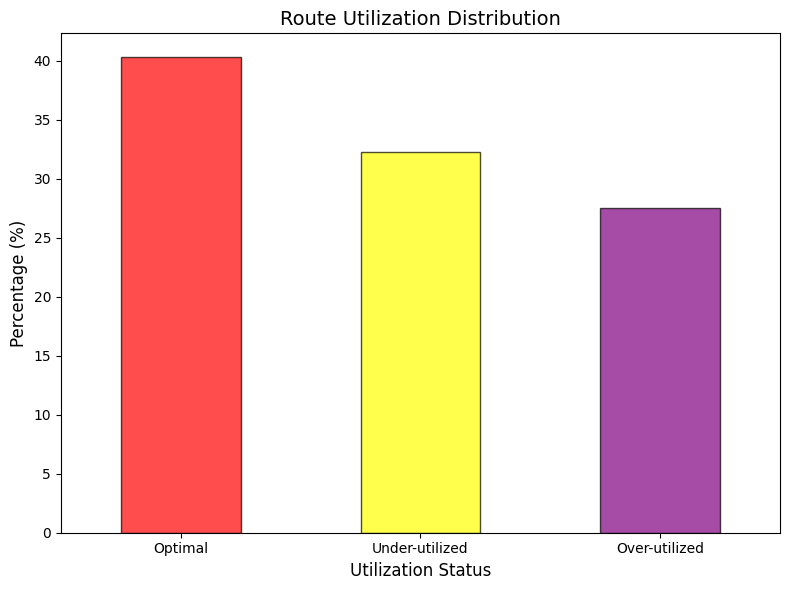

Origin,Destination,Total_Passengers,Total_Flights,Avg_Passengers_Per_Flight,Utilization_Status
ABE,ACT,0,1,0.000000,Under-utilized
ABE,ACY,73,1,73.000000,Optimal
ABE,AGS,104,2,52.000000,Optimal
ABE,ALB,8351,1341,6.227442,Under-utilized
ABE,ATL,1053895,18304,57.577306,Optimal
...,...,...,...,...,...
YUM,SLC,16432,467,35.186296,Optimal
YUM,SVN,70,1,70.000000,Optimal
YUM,TCM,278,3,92.666667,Over-utilized
YUM,TUS,132,30,4.400000,Under-utilized


In [46]:
route_utilization = analyze_route_utilization(data)

#### **1.3.4. Visualizing the Flight Network’s Geographic Spread**

##### **1.3.4.1. Sampling for Faster Map Generation**

When working with large datasets, processing all flight connections can be time-consuming. Instead, sampling a subset of connections helps generate the map faster while still providing valuable insights.

**Step 1: Identifying Missing Coordinates**

In [47]:
# Check for missing coordinates
missing_origin_coords = data[
    data['Org_airport_lat'].isnull() | data['Org_airport_long'].isnull()
]['Origin_airport'].unique()

missing_dest_coords = data[
    data['Dest_airport_lat'].isnull() | data['Dest_airport_long'].isnull()
]['Destination_airport'].unique()

missing_airports = set(missing_origin_coords).union(set(missing_dest_coords))

print(f"Number of airports with missing coordinates: {len(missing_airports)}")
print("Airports with missing coordinates:")
print(missing_airports)

Number of airports with missing coordinates: 0
Airports with missing coordinates:
set()


**Step 2: Completing Missing Coordinates**

In [48]:
# OpenStreetMap geocoder control
geolocator = Nominatim(user_agent="flight_network")
location = geolocator.geocode("Los Angeles airport")
print(location.latitude, location.longitude)

33.94216754999999 -118.42135906141587


In [49]:

# Initialize the OpenStreetMap Geocoder
geolocator = Nominatim(user_agent="airport_locator")

def prepare_missing_airports_with_cities(missing_airports, dataset):
    
    missing_airports_with_cities = {}
    for airport in missing_airports:
        
        city_info = dataset.loc[dataset['Origin_airport'] == airport, 'Origin_city']
        if city_info.empty:
            city_info = dataset.loc[dataset['Destination_airport'] == airport, 'Destination_city']
        
      
        missing_airports_with_cities[airport] = city_info.values[0] if not city_info.empty else None
    return missing_airports_with_cities

def fetch_coordinates_with_fallback(airport_code, city_name=None):
    
    try:
        
        if airport_code:
            location = geolocator.geocode(f"{airport_code} airport")
            if location:
                return location.latitude, location.longitude
        
        
        if city_name:
            location = geolocator.geocode(city_name)
            if location:
                return location.latitude, location.longitude
    except Exception as e:
        print(f"Error fetching coordinates for {airport_code} or {city_name}: {e}")
    return None, None

# Missing airport codes
missing_airports = ['TN6', 'FVS', 'TN3', 'JSE', 'VWH', 'JCC', 'JZU', 'JRA', 'LWF', 'KY3',
                    'OH3', 'ESF', 'HIK', 'OH1', 'OH5', 'LSD', 'AWX', 'MI2', 'XWL', 'AIY',
                    'LJY', 'HLM', 'ZXX', 'VWT', 'TX6', 'CGX', 'VWD', 'TSS', 'KY1', 'IN1',
                    'KY5', 'DQU', 'OH2', 'NZJ', 'STF', 'WV1', 'UXJ', 'XXW', 'NY3', 'WQM',
                    'JRB', 'VWL', 'DQC', 'DQF']

# Map missing airport codes to their corresponding cities
missing_airports_with_cities = prepare_missing_airports_with_cities(missing_airports, data)

missing_coords = {}
not_found_coords = []

for airport, city in missing_airports_with_cities.items():
    lat, lon = fetch_coordinates_with_fallback(airport, city)
    if lat and lon:
        missing_coords[airport] = (lat, lon)
    else:
        not_found_coords.append(airport)
        print(f"Coordinates not found for {airport}.")
    time.sleep(1)  

# Summary of completed and missing coordinates
completed_count = len(missing_coords)
not_found_count = len(not_found_coords)

print(f"\nCompleted coordinates: {completed_count}")
print(missing_coords)

if not_found_count > 0:
    print(f"\nCoordinates not found: {not_found_count}")
    print(not_found_coords)

Coordinates not found for TN6.
Coordinates not found for FVS.
Coordinates not found for TN3.
Coordinates not found for JSE.
Coordinates not found for VWH.
Coordinates not found for JCC.
Coordinates not found for JZU.
Coordinates not found for JRA.
Coordinates not found for LWF.
Coordinates not found for KY3.
Coordinates not found for OH3.
Coordinates not found for ESF.
Coordinates not found for HIK.
Coordinates not found for OH1.
Coordinates not found for OH5.
Coordinates not found for LSD.
Coordinates not found for AWX.
Coordinates not found for MI2.
Coordinates not found for XWL.
Coordinates not found for AIY.
Coordinates not found for LJY.
Coordinates not found for HLM.
Coordinates not found for ZXX.
Coordinates not found for VWT.
Coordinates not found for TX6.
Coordinates not found for CGX.
Coordinates not found for VWD.
Coordinates not found for TSS.
Coordinates not found for KY1.
Coordinates not found for IN1.
Coordinates not found for KY5.
Coordinates not found for DQU.
Coordina

**Step 3: Add Missing Coordinates to the Dataset**

In [21]:
missing_origin_coords = data[data['Org_airport_lat'].isnull() | data['Org_airport_long'].isnull()]['Origin_airport'].unique()
missing_destination_coords = data[data['Dest_airport_lat'].isnull() | data['Dest_airport_long'].isnull()]['Destination_airport'].unique()

remaining_missing_airports = list(set(missing_origin_coords).union(set(missing_destination_coords)))


remaining_missing_with_cities = prepare_missing_airports_with_cities(remaining_missing_airports, data)

remaining_coords = {}
for airport, city in remaining_missing_with_cities.items():
    lat, lon = fetch_coordinates_with_fallback(airport, city)
    if lat and lon:
        remaining_coords[airport] = (lat, lon)
    else:
        print(f"Coordinates not found for {airport}.")
    time.sleep(1)  

for airport, coords in remaining_coords.items():
   
    data.loc[data['Origin_airport'] == airport, ['Org_airport_lat', 'Org_airport_long']] = coords
   
    data.loc[data['Destination_airport'] == airport, ['Dest_airport_lat', 'Dest_airport_long']] = coords

remaining_missing_coords = data[
    data['Org_airport_lat'].isnull() | data['Dest_airport_lat'].isnull()
]
print(f"\nNumber of remaining missing coordinates: {len(remaining_missing_coords)}")


Number of remaining missing coordinates: 0


In [22]:
# Sample a subset of data for faster map rendering
sampled_data = data.sample(n=1000, random_state=42) 

m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)


marker_cluster = MarkerCluster().add_to(m)


for _, row in sampled_data.iterrows():
    if not pd.isna(row["Org_airport_lat"]) and not pd.isna(row["Dest_airport_lat"]):
       
        folium.Marker(
            location=[row["Org_airport_lat"], row["Org_airport_long"]],
            icon=folium.Icon(icon="plane", prefix="fa", color="blue"),
            tooltip=f"Origin: {row['Origin_city']}"
        ).add_to(marker_cluster)

       
        folium.Marker(
            location=[row["Dest_airport_lat"], row["Dest_airport_long"]],
            icon=folium.Icon(icon="plane", prefix="fa", color="green"),
            tooltip=f"Destination: {row['Destination_city']}"
        ).add_to(marker_cluster)


for _, row in sampled_data.iterrows():
    if not pd.isna(row["Org_airport_lat"]) and not pd.isna(row["Dest_airport_lat"]):
        folium.PolyLine(
            locations=[
                [row["Org_airport_lat"], row["Org_airport_long"]],
                [row["Dest_airport_lat"], row["Dest_airport_long"]]
            ],
            color="blue",
            weight=1,
        ).add_to(m)


m

Analysis of Sampling:

1.	Improved Efficiency:

•	By sampling 1,000 connections, the map is generated significantly faster compared to processing the entire dataset.

•	Sampling strikes a balance between computational efficiency and meaningful visualization.

2.	Preserved Insights:

•	The sampled subset still provides a representative view of the network’s structure and key connections.

•	Major hubs and heavily trafficked routes remain visible.

3.	Flexibility:

•	The sample size can be adjusted (n=1000) to suit specific needs or hardware limitations.

Commentary

•	Sampling allows for quicker map generation without compromising the overall insights into the network’s structure.

•	The random sample ensures a fair representation of flight connections while avoiding unnecessary processing of the entire dataset.

•	For larger datasets or more granular analysis, stratified sampling could be implemented to focus on specific hubs or regions.

•	This approach is particularly beneficial when generating interactive maps, where rendering speed greatly impacts usability.

##### **1.3.4.2. Filtered Map: Showing Only the Busiest Routes**

In [23]:
# Filter the top 100 busiest routes based on the number of passengers
top_routes = data.sort_values(by="Passengers", ascending=False).head(100)

for _, row in top_routes.iterrows():
    if not pd.isna(row["Org_airport_lat"]) and not pd.isna(row["Dest_airport_lat"]):
        folium.PolyLine(
            locations=[
                [row["Org_airport_lat"], row["Org_airport_long"]],
                [row["Dest_airport_lat"], row["Dest_airport_long"]]
            ],
            color="blue",
            weight=1,
        ).add_to(m)


m

Purpose of Filtering:

1.	Focus on Key Connections:

•	By limiting the visualization to the 100 busiest routes, the map becomes more focused and easier to interpret.

•	Highlights the most significant connections in terms of passenger traffic.

2.	Improved Clarity:

•	Reduces clutter on the map, especially for datasets with a large number of routes.

•	Ensures the visualization emphasizes key hubs and traffic patterns.

3.	Customizability:

•	The threshold (e.g., top 100 routes) can be adjusted based on specific analysis requirements or regional focus.

Analysis of Results:

1.	Insights from Busiest Routes:

•	The map clearly illustrates the major hubs and their key connections.

•	Airports like Atlanta (ATL), Chicago (ORD), and Los Angeles (LAX) likely dominate these routes due to their central role in the network.

2.	Strategic Importance of Top Routes:

•	The busiest routes often align with major economic or tourist centers.

•	These routes are critical for ensuring high passenger flow and efficient connectivity within the network.

3.	Focus on Specific Regions or Routes:

•	This filtering approach can be further refined to focus on routes within a specific geographic region or connecting particular hubs (e.g., East Coast, West Coast, or Hawaii).

Commentary

•	Filtering to display only the busiest routes provides a clear and actionable view of the most critical connections within the flight network.
	
•	The visualization highlights the importance of major hubs and their role in connecting high-demand destinations.
	
•	This approach allows for focused analysis, which is particularly useful for identifying patterns or potential bottlenecks in the network.
	
•	Adjusting the filter threshold can enable region-specific analyses or comparisons across different traffic tiers.

## **2. Nodes' Contribution (Q2)**
---
### 1) Implement a function analyze_centrality(flight_network, airport) that computes the following centrality measures for a given airport:

- Betweenness centrality: Measures how often a node appears on the shortest paths between other nodes.
- Closeness centrality: Measures how easily a node can access all other nodes in the network.
- Degree centrality: Simply counts the number of direct connections to the node.
- PageRank: Computes the "importance" of a node based on incoming connections and their weights.



This dataset contains multiple distances for the same origin and destination airports so we need to take the mean of those values to assign a weight to those edges.

In [ ]:
# just to show an example of this problem
print(df['Distance'].loc[(df['Origin_airport'] == "ABE") & (df['Destination_airport'] == "CLT") ])

# we will aggreagate by taking the mean of the distance
data = df.groupby(['Origin_airport', 'Destination_airport']).agg({'Distance': 'mean'}).reset_index() 

# we will also delite all the rows that have the same starting and ending airports
data = data.loc[data['Distance'] != 0]

1980810    480
1980812    480
1980824    480
1980825    480
1980826    480
          ... 
2059076    481
2059077    481
2059078    481
2059088    481
2059248    481
Name: Distance, Length: 565, dtype: int64


In [ ]:
# We can now create the Directed Graph, this graph will not be a Strongly Connected Graph as not every node
# in the graph is reacheable from every other
Data_Graph = nx.DiGraph()
for _, row in data.iterrows():
    origin = row['Origin_airport']
    destination = row['Destination_airport']
    weight = int(row['Distance'])
    Data_Graph.add_edge(origin, destination, weight=weight)

#just to show this:
print(f"Is this a SCC graph?: {nx.is_strongly_connected(Data_Graph)}")


Is this a SCC graph?: False


To compute the centrality measure required without implementing any nx functions we need to have an adjacency matrix( in this case a list) and teh collections of all the shortest paths and distances:

In [ ]:
#Since the adjacency matrix would be very sparse, we will instead conpute an adjacency list

adjacency_list = {node: [] for node in Data_Graph.nodes} # we can initialize a dictionary

for edge in Data_Graph.edges: #iterate over all the edges in the graph

    source, target = edge
    adjacency_list[source].append(target)  #add the connections for each source node


In [ ]:
#we will then use our own function to compute the shortest paths from each node to all the others and 
# all the shortest distances

all_paths, all_distances = all_shortest_paths(Data_Graph, adjacency_list)

### A short introduction for all these measures:

1) betweenness centrality: 

The betweenness centrality of a node $ v $ is given by the expression:

$
g(v) = \sum_{s \neq v \neq t} \frac{\sigma_{st}(v)}{\sigma_{st}}
$

where $ \sigma_{st} $ is the total number of shortest paths from node $ s $ to node $ t $ and $ \sigma_{st}(v) $ is the number of those paths that pass through $ v $ (not where $ v $ is an endpoint).

---
(...) Therefore, the calculation may be rescaled by dividing through by the number of pairs of nodes not including $ v $, so that $ g \in [0, 1] $. The division is done by $ (N-1)(N-2) $ for directed graphs and $ \frac{(N-1)(N-2)}{2} $ for undirected graphs, where $ N $ is the number of nodes in the **giant component**.

*Source Wikipedia*

2) closeness centrality: 

Here we must remember that this centrality measures work for connected graph, so the definition we want to look at is this:

When a graph is not **strongly connected**, Beauchamp introduced in 1965 the idea of using the sum of reciprocal of distances, instead of the reciprocal of the sum of distances, with the convention:

$
\frac{1}{\infty} = 0
$

The formula is given as:

$
H(x) = \sum_{y \neq x} \frac{n - 1}{d(y, x)}.
$

*Source Wikipedia*

3) in-degree centrality: 

The in-degree centrality for a node v is the fraction of nodes its incoming edges are connected to.
The degree centrality values are normalized by dividing by the maximum possible degree in a simple graph n-1 where n is the number of nodes in G.

*Source Networkx packet's documentation*

4) PageRank:

The PageRank algorithm outputs a probability distribution used to represent the likelihood that a person randomly clicking on links will arrive at any particular page. PageRank can be calculated for collections of documents of any size. It is assumed in several research papers that the distribution is evenly divided among all documents in the collection at the beginning of the computational process. The PageRank computations require several passes, called "iterations", through the collection to adjust approximate PageRank values to more closely reflect the theoretical true value.

A probability is expressed as a numeric value between 0 and 1. A 0.5 probability is commonly expressed as a "50% chance" of something happening. Hence, a document with a PageRank of 0.5 means there is a 50% chance that a person clicking on a random link will be directed to said document.

*Source Wikipedia*


Now we have all we need to compute the centrality measures.

In [ ]:

def analyze_centrality(graph, airport, all_paths, all_distances, adjacency_list):
    
    betweenness_centrality_scores = betweenness_centrality(Data_Graph, all_paths)

    closeness_scores = closeness_centrality(all_distances)

    in_degree_centrality = in_degree_centrality_adj(adjacency_list)

    pagerank_scores = compute_pagerank(Data_Graph, adjacency_list)

    final_scores = {
    "Betweenness Centrality" : betweenness_centrality_scores,
    "Closeness Centrality" : closeness_scores,
    "In-Degree Centrality" : in_degree_centrality,
    "PageRank Score" : pagerank_scores
    }

    for metric, scores in final_scores.items():
        print(f"The {metric} for Airport {airport} is: {scores[airport]:.4f}\n")
    



We can simply use this function to print the scores:

In [ ]:
# as an example:
analyze_centrality(Data_Graph, "CLT", all_paths, all_distances, adjacency_list)

The Betweenness Centrality for Airport CLT is: 0.0069

The Closeness Centrality for Airport CLT is: 1.0860

The In-Degree Centrality for Airport CLT is: 0.2617

The PageRank Score for Airport CLT is: 0.0037



---
### 2) Write a function compare_centralities(flight_network) to:

- Compute and compare centrality values for all nodes in the graph.
- Plot centrality distributions (histograms for each centrality measure).
- Return the top 5 airports for each centrality measure.


In [ ]:

def compare_centralities(Data_Graph, all_paths, all_distances, adjacency_list):

    final_scores = {
    "Betweenness Centrality" : betweenness_centrality(Data_Graph, all_paths),
    "Closeness Centrality" : closeness_centrality(all_distances),
    "In-Degree Centrality" : in_degree_centrality_adj(adjacency_list),
    "PageRank" : compute_pagerank(Data_Graph, adjacency_list)
    }
    
    plot_centrality_distributions(final_scores)

    top_5 = {
        metric: sorted(scores.items(), key=lambda x: x[1], reverse=True)[:5] for metric, scores in final_scores.items()
    }

    # Print top 5 nodes for each centrality measure
    for metric, top_nodes in top_5.items():
        print(f"\nTop 5 Nodes by {metric}:")
        for node, score in top_nodes:
            print(f"Node {node}: {score:.4f}")
    

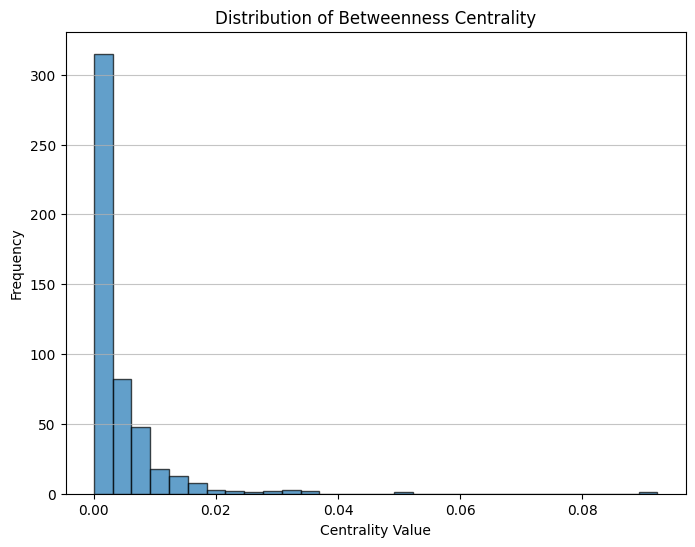

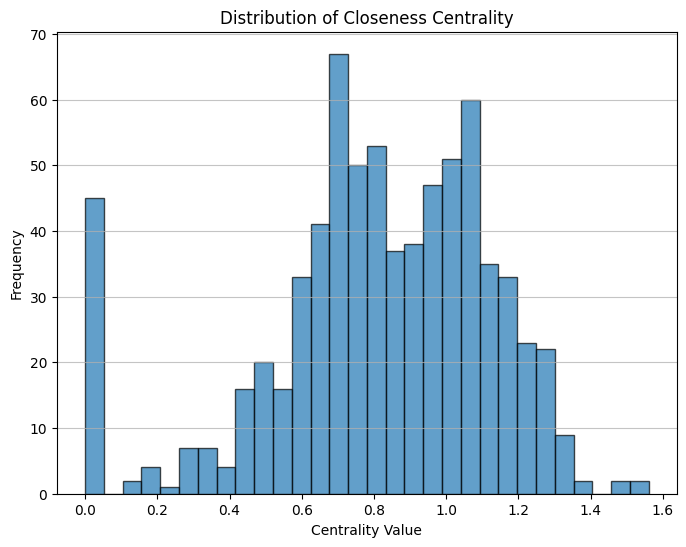

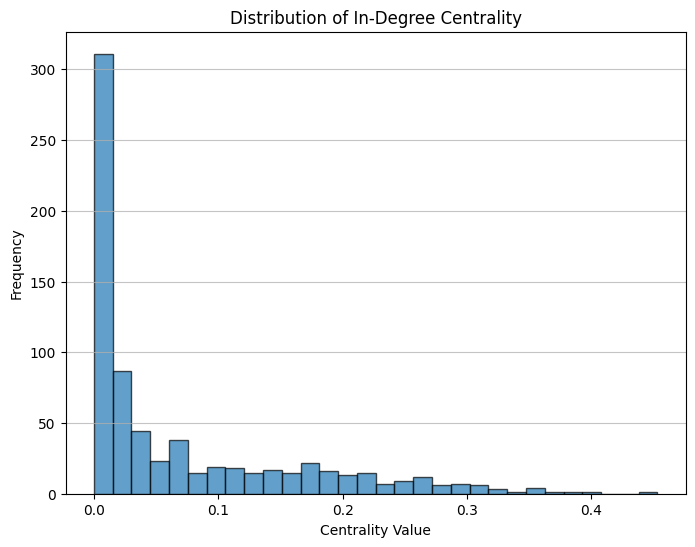

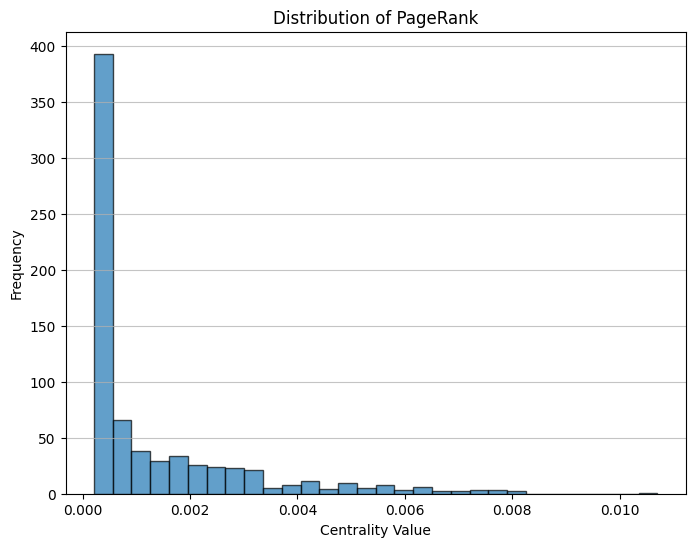


Top 5 Nodes by Betweenness Centrality:
Node YIP: 0.0923
Node MEM: 0.0497
Node DFW: 0.0356
Node MCI: 0.0344
Node LAS: 0.0331

Top 5 Nodes by Closeness Centrality:
Node JRB: 1.5610
Node JRA: 1.5253
Node YIP: 1.4728
Node DTW: 1.4589
Node MDW: 1.3870

Top 5 Nodes by In-Degree Centrality:
Node YIP: 0.4532
Node MSP: 0.3994
Node MEM: 0.3802
Node MCI: 0.3733
Node ATL: 0.3554

Top 5 Nodes by PageRank:
Node YIP: 0.0107
Node ANC: 0.0081
Node LAX: 0.0080
Node LAS: 0.0079
Node MSP: 0.0079


In [ ]:
compare_centralities(Data_Graph, all_paths, all_distances, adjacency_list)

As we can see in the output above 3 of the 4 metrics give the highest score to the YIP airport.

---
### 3) Ask LLM (eg. ChatGPT) to suggest alternative centrality measures that might be relevant to this task. How can you check that the results given by the LLM are trustable?

### Good Fifth Metric for a DiGraph Related to Airport Traffic

A **good fifth metric** for analyzing airport traffic in a directed graph is **Eigenvector Centrality**. This measure considers both the direct connections of a node and the importance of the nodes it is connected to. In airport networks, this metric helps identify airports that are influential because of their connections to other key hubs.

---

#### Mathematical Explanation of Eigenvector Centrality

The **Eigenvector Centrality** of a node $v_i$ is given by:

$
x_i = \frac{1}{\lambda} \sum_{j \in N(i)} A_{ji} x_j
$

Where:
- $x_i$: The centrality score of node $i$.
- $\lambda$: The largest eigenvalue of the adjacency matrix $A$.
- $A_{ji}$: The entry in the adjacency matrix representing the edge weight from node $j$ to node $i$.
- $N(i)$: The set of nodes that point to $i$ (its in-neighbors).

In matrix form, this can be written as:

$
Ax = \lambda x
$

Where $x$ is the eigenvector corresponding to the largest eigenvalue $\lambda$.

---

#### Why is Eigenvector Centrality Suitable for Airport Traffic?

- **Weighted Connections**: In an airport network, edge weights can represent passenger volume or flight frequency. Eigenvector Centrality emphasizes airports connected to busy hubs.
- **Indirect Influence**: It accounts for the influence of both direct and indirect connections, highlighting airports that are critical due to their links to other important hubs.


#### However Eigenvector Centrality is not applicable to disconnected graphs as ours due to the fact that, in a disconnected graph, the eigenvector computation may yield zeros for some nodes that are not reachable from other parts of the graph, so we asked GPT again for a solution:

#### This is the explanation we got:

### Explanation of the Solution
1) Strongly Connected Components:
    - The graph is split into its strongly connected components using nx.strongly_connected_components().
2) Per-Component Calculation:
    - Eigenvector Centrality is computed separately for each strongly connected component using nx.eigenvector_centrality_numpy().
3) Combining Results:
    - The scores from all components are combined into a single dictionary.

#### Why Does This Work?
By breaking the graph into strongly connected components:
1) Eigenvector Centrality is calculated where it makes sense (within connected parts of the graph).
2) Nodes in disconnected components are handled independently.

In [ ]:
def compute_eigenvector_centrality_for_disconnected(graph):
    """
    Compute Eigenvector Centrality for a disconnected graph.

    Args:
        graph (nx.DiGraph): A directed graph with weighted edges.

    Returns:
        dict: A dictionary where keys are nodes and values are their Eigenvector Centrality scores.
    """
    # Initialize the dictionary for the final scores
    eigenvector_scores = {}

    # Identify strongly connected components
    sccs = list(nx.strongly_connected_components(graph))

    # Compute Eigenvector Centrality for each SCC
    for scc in sccs:
        if len(scc) > 1:  # Only compute for components with more than one node
            subgraph = graph.subgraph(scc)
            sub_scores = nx.eigenvector_centrality_numpy(subgraph, weight='weight')
            eigenvector_scores.update(sub_scores)
        else:
            # Assign a score of 0.0 for isolated nodes
            isolated_node = list(scc)[0]
            eigenvector_scores[isolated_node] = 0.0

    return eigenvector_scores

# Compute Eigenvector Centrality for disconnected graph
eigenvector_scores = compute_eigenvector_centrality_for_disconnected(Data_Graph)

# Display results
print("Eigenvector Centrality Scores:")
for airport, score in eigenvector_scores.items():
    print(f"Airport {airport}: {score:.6f}")


Eigenvector Centrality Scores:
Airport ARB: 0.000000
Airport FCM: 0.000000
Airport AWX: 0.000000
Airport AL3: 0.000000
Airport DWH: 0.000000
Airport ESN: 0.000000
Airport FAM: 0.000000
Airport BYI: 0.000000
Airport FVS: 0.000000
Airport LJY: 0.000000
Airport MIW: 0.000000
Airport RAC: 0.000000
Airport CFV: 0.000000
Airport O85: 0.000000
Airport RBL: 0.000000
Airport NGP: 0.000000
Airport XWL: 0.000000
Airport SNL: 0.000000
Airport STE: 0.000000
Airport NZJ: 0.000000
Airport STK: 0.000000
Airport OLU: 0.000000
Airport RVS: 0.000000
Airport JWN: 0.000000
Airport IDI: 0.000000
Airport MEJ: 0.000000
Airport MUT: 0.000000
Airport PHD: 0.000000
Airport DTN: 0.000000
Airport ULS: 0.000000
Airport UXJ: 0.000000
Airport MWC: 0.000000
Airport TVI: 0.000000
Airport PRZ: 0.000000
Airport SNS: 0.000000
Airport OGB: 0.000000
Airport RSN: 0.000000
Airport WVL: 0.000000
Airport ZXX: 0.000000
Airport MPS: 0.000000
Airport SME: 0.000000
Airport HUA: 0.000000
Airport TDW: 0.000000
Airport AYS: 0.000000
A

#### As we can see the produced output gives many zeros as expected. So we asked again for a new centrality measure and this is the answer we got:

### Suggestion for a Centrality Measure in Disconnected Graphs: Katz Centrality

#### **Why Katz Centrality?**

Katz Centrality is a suitable alternative to Eigenvector Centrality, especially for disconnected graphs. Unlike Eigenvector Centrality, which assigns a score of zero to disconnected nodes, Katz Centrality incorporates an external bias term and a damping factor. These components ensure that every node has a non-zero centrality score, even if it is isolated or part of a disconnected component.

---

#### **Mathematical Definition**

The **Katz Centrality** of a node \( i \) is defined as:

\[
C_k(i) = \beta + \alpha \sum_{j \in N(i)} A_{ji} C_k(j)
\]

Where:
- \( C_k(i) \): Katz Centrality score of node \( i \).
- \( \beta \): External bias term (often set to 1), ensuring non-zero scores for all nodes.
- \( \alpha \): Damping factor, which attenuates the influence of distant nodes (\( \alpha \) must satisfy \( \alpha < \frac{1}{\lambda_{\text{max}}} \), where \( \lambda_{\text{max}} \) is the largest eigenvalue of the adjacency matrix \( A \)).
- \( A_{ji} \): Entry in the adjacency matrix representing the edge weight from node \( j \) to node \( i \).
- \( N(i) \): The set of nodes pointing to \( i \) (in-neighbors).

In matrix form:

\[
C_k = (\mathbf{I} - \alpha \mathbf{A})^{-1} \mathbf{\beta}
\]

Where:
- \( \mathbf{I} \): Identity matrix.
- \( \mathbf{A} \): Adjacency matrix of the graph.

---

#### **Why is Katz Centrality Suitable for Airport Traffic?**

1. **Handles Disconnected Graphs**:
   - The external bias term (\( \beta \)) ensures that all nodes, even those in disconnected components, receive a score.

2. **Captures Indirect Influence**:
   - Katz Centrality accounts for both direct and indirect connections, making it valuable in analyzing the broader influence of an airport within a network.

3. **Weighted Connections**:
   - The adjacency matrix can incorporate weights (e.g., passenger volume, flight frequency), providing a more nuanced analysis.

---

#### **Implementation in Python**

Here is how to compute Katz Centrality for a directed graph:


In [ ]:
def compute_katz_centrality(graph, alpha=0.1, beta=1.0):
    """
    Compute Katz Centrality for the graph.

    Args:
        graph (nx.DiGraph): A directed graph with weighted edges.
        alpha (float): Attenuation factor (must be < 1 / largest eigenvalue of the adjacency matrix).
        beta (float): External bias term.

    Returns:
        dict: A dictionary where keys are nodes and values are their Katz Centrality scores.
    """
    return nx.katz_centrality(graph, alpha=alpha, beta=beta, weight='weight')


## **3. Finding Best Routes (Q3)**

### Problem Overview
The task is to find the most efficient and fastest flight route between two cities, considering flights on a specific day. The "best route" is defined as the one that minimizes the total distance flown. The function must compute the best route for every possible airport pair between the origin and destination cities. If no valid route exists between any pair, the system should report it.

### Inputs and Outputs

**Inputs:**
1. **Flights Network (flights_df)**: A DataFrame containing flight information with the following columns:
    - `'Fly_date'`: Date of the flight.
    - `'Origin_airport'`: Code of the origin airport.
    - `'Destination_airport'`: Code of the destination airport.
    - `'Distance'`: Distance between the airports.
    - `'Origin_city'`: Name of the city where the flight originates.
    - `'Destination_city'`: Name of the city where the flight lands.
   
2. **Origin city name**: The name of the origin city.
3. **Destination city name**: The name of the destination city.
4. **Considered Date (yyyy-mm-dd format)**: The date on which to find flights.

**Output:**
A DataFrame containing the best flight routes for all origin-destination airport pairs:
- `'Origin_city_airport'`: Airport code of the origin city.
- `'Destination_city_airport'`: Airport code of the destination city.
- `'Best_route'`: Shortest route as a string (e.g., `'Airport1 -> Airport2 -> Airport3'`) or `'No route found'` if no route exists.

### Solution Approach

**1. Filtering Flights for the Given Date:** The function begins by filtering the flights DataFrame to only include flights for the specified date. This ensures that only relevant flights are considered in the computation.

**2. Constructing the Flight Network Graph:** A dictionary `graph` is created to represent the flight network. The keys are airport codes, and the values are lists of tuples, where each tuple contains a destination airport and the corresponding flight distance.

**3. Extracting Airports for the Origin and Destination Cities:** The airports corresponding to the origin and destination cities are identified by filtering the DataFrame based on the `Origin_city` and `Destination_city` columns.

**4. Implementing Dijkstra's Algorithm:** Dijkstra's algorithm is used to find the shortest path between two airports. This algorithm is well-suited for this problem because it efficiently computes the shortest path in a graph with weighted edges (flight distances).

- **Priority Queue (Min-Heap)**: The algorithm uses a priority queue to always expand the shortest path first.
- **Visited Set**: A set is used to track visited airports to prevent revisiting them and ensure that the algorithm terminates correctly.

The function `dijkstra(start, target)` is implemented to find the shortest path between a starting airport and a target airport.

**5. Calculating Best Routes for All Airport Pairs:** For each airport in the origin city, the function computes the shortest path to each airport in the destination city using Dijkstra's algorithm. The results are stored in a list, with each entry containing the origin airport, destination airport, and the best route (or `'No route found'` if no path exists).

**6. Returning the Results:** The results are converted into a pandas DataFrame, which is returned to the user. This DataFrame contains the best routes for all origin-destination airport pairs.

In [52]:
df = pd.read_csv('C:/Users/User/Desktop/Sapienza/ADM/Airports2_transformed.csv', low_memory=False)

In [55]:
# Find the best route between Seattle and San Francisco on 01/11/2005
result = ss.find_best_route(df, 'Seattle, WA', 'San Francisco, CA', '2005-11-01')

display(result)

,Origin_city_airport,Destination_city_airport,Best_route
0,SEA,SFO,SEA -> SFO
1,BFI,SFO,BFI -> SMF -> SFO


## **4. Airline Network Partitioning (Q4)**

### Problem Statement
We aim to model an airline network as a graph and partition it for analysis. The network consists of:
- **Nodes**: Airports.
- **Edges**: Flights between airports, which may be unidirectional (i.e., a flight exists from `A` to `B` but not necessarily from `B` to `A`).
- **Weights**: Distances between airports.

The task is to identify and remove the minimum set of edges such that the graph is partitioned into distinct subgraphs, ensuring that the resulting partitions are meaningful for further analysis.

---

### Approach: Minimum Cut Problem
The problem is modeled as a **minimum cut problem**, which is a classic graph theory problem. The goal is to find the smallest set of edges that, when removed, disconnects the graph into two or more components.

#### **Key Concepts**
1. **Graph Representation**: 
   - The airline network is represented as a **weighted, directed graph**.
   - Weights on the edges correspond to the "cost" or "distance" of flights between airports.

2. **Minimum Cut Problem**:
   - The **minimum cut problem** seeks to partition the graph into two disconnected components by removing edges such that the total weight of the removed edges is minimized.
   - This ensures that the disconnection is achieved with minimal impact on the network.

---

### Algorithm: Ford-Fulkerson Method
To solve the minimum cut problem, we use the **Ford-Fulkerson algorithm** in conjunction with the **Max-Flow Min-Cut Theorem**. The steps are as follows:

1. **Max-Flow Computation**:
   - The algorithm calculates the maximum flow from a designated **source** node to a **sink** node.
   - Flow represents the capacity of connections between nodes (e.g., the number of flights or total connectivity strength).

2. **Min-Cut Identification**:
   - Once the maximum flow is determined, the corresponding **minimum cut** is derived.
   - The cut represents the edges that, if removed, disconnect the graph into distinct components.

---

### Implementation Details

#### **Graph Construction**
- We use an adjacency list to represent the graph:
  - Nodes (airports) are keys.
  - Values are dictionaries of neighboring nodes and their respective edge weights (distances).

#### **Ford-Fulkerson Algorithm**
- The algorithm works iteratively:
  1. Finds augmenting paths from the source to the sink using BFS or DFS.
  2. Updates residual capacities along the path.
  3. Repeats until no more augmenting paths exist.
- The result is the maximum flow, which is then used to compute the minimum cut.

#### **Edge Removal for Partitioning**
- Using the edges identified by the minimum cut, we remove them to partition the graph.
- This creates two or more disconnected subgraphs.

---

### Visualization with NetworkX
To visualize the network and its partitions:
1. **Initial Graph**:
   - Nodes represent airports, styled with unique colors.
   - Edges represent flights, with weights indicating distances.

2. **Partitioned Graph**:
   - Removed edges (from the minimum cut) are highlighted in red and dashed.
   - Remaining edges are shown in blue to indicate retained connectivity.


---

### Summary
This solution leverages the **Ford-Fulkerson algorithm** to solve the **minimum cut problem** for an airline network:
- **Algorithm**: Max-Flow Min-Cut theorem using Ford-Fulkerson.
- **Objective**: Partition the graph into subgraphs by removing the smallest set of edges.
- **Tools**: Python's `networkx` for visualization.
- **Output**: A clear visualization of the network, showing the removed edges and resulting partitions for meaningful insights.


In [56]:
df = pd.read_csv('C:/Users/User/Desktop/Sapienza/ADM/Airports2_transformed.csv', low_memory=False)

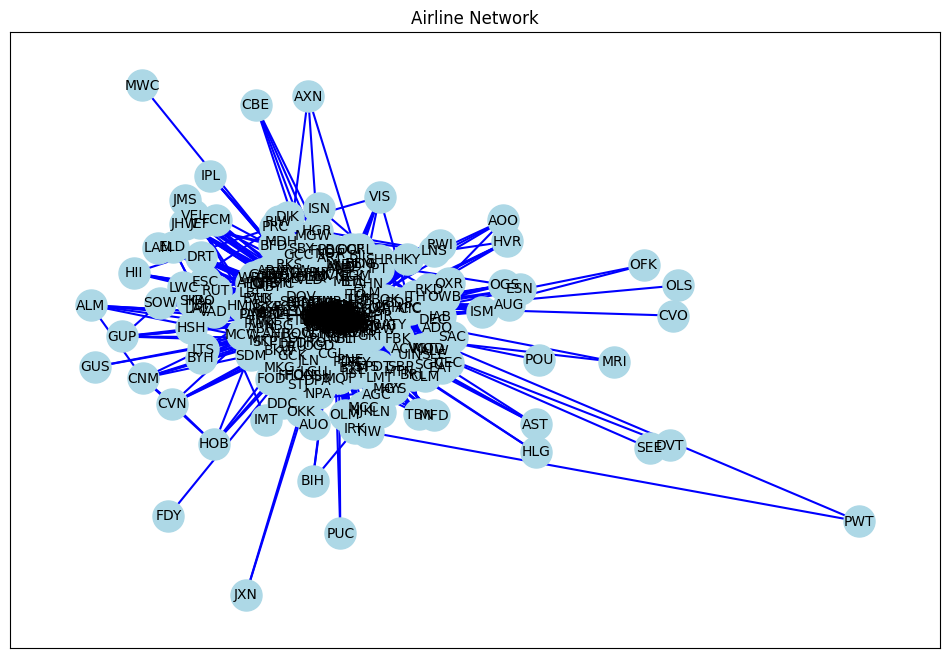

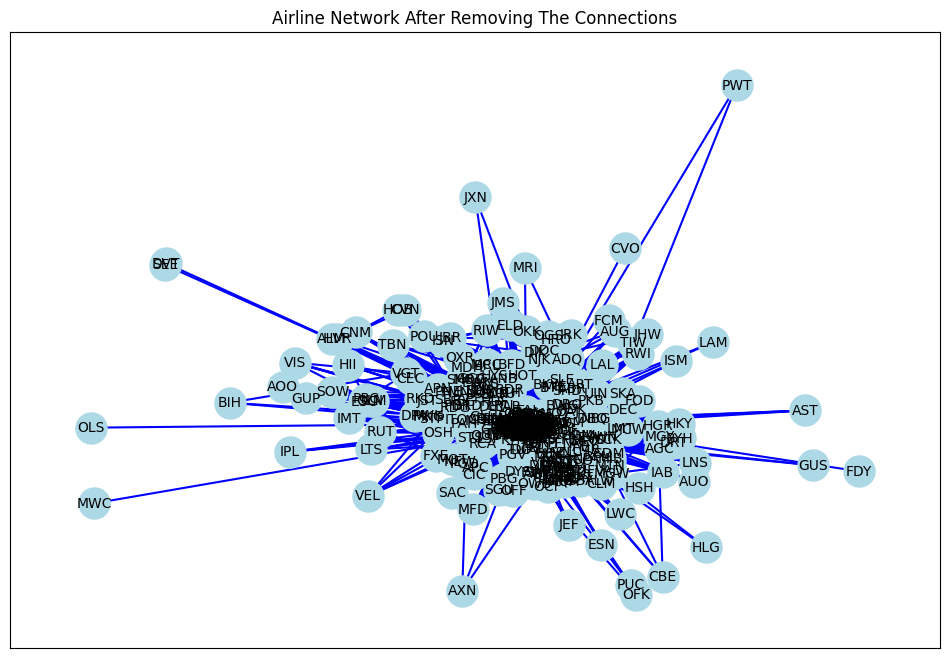

In [57]:
# Partition the graph
removed_edges, graph, residual_graph = ap.airline_partitioning(df)

## **5. Finding and Extracting Communities (Q5)**

### **5.1. Graph Analysis**

In [50]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from functions.q5_1 import *

In [2]:
data = pd.read_csv('Airports2.csv')

#### **Data Preprocessing for the purpose of this point**

In [3]:
df = data.copy()

df = df.dropna(subset=['Origin_city', 'Destination_city'])
df = df.drop_duplicates(subset=['Origin_city', 'Destination_city'])
df = df[df['Origin_city'] != df['Destination_city']]
df['Origin_city'] = df['Origin_city'].str.title()
df['Destination_city'] = df['Destination_city'].str.title()
df = df[(df['Flights'] > 0) & (df['Distance'] > 0) & (df['Passengers'] > 0) & (df['Seats'] > 0)]

Q1 = df['Distance'].quantile(0.25)
Q3 = df['Distance'].quantile(0.75)
IQR = Q3 - Q1
df = df[~((df['Distance'] < (Q1 - 1.5 * IQR)) | (df['Distance'] > (Q3 + 1.5 * IQR)))]

####  **Creation of the graph starting from the dataset**

In [4]:
G = nx.from_pandas_edgelist(df, 'Origin_city', 'Destination_city')

#### **Graph Visualization**

(449, 13344)

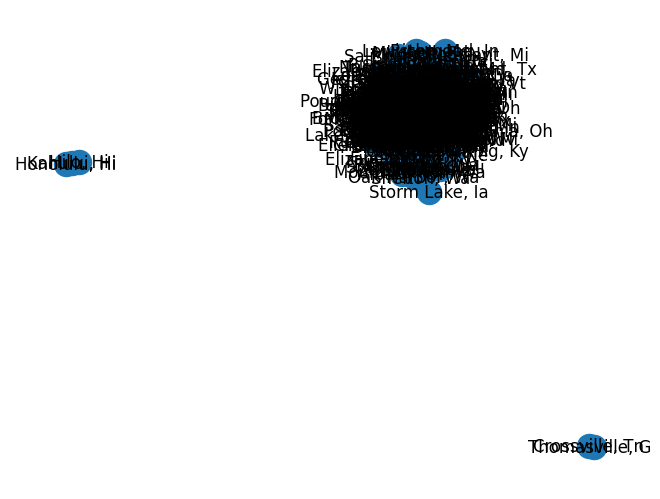

In [10]:
# visualize the graph
nx.draw(G, with_labels = True)
len(G.nodes), len(G.edges)

#### **Function**

In [12]:
def community_detection(graph, c1, c2):
	"""
	This function takes a graph and two nodes, c1 and c2, and performs community detection using the Girvan-Newman algorithm.
	It returns the detected communities, the number of communities, and a boolean indicating whether c1 and c2 are in the same community.
	Parameters:
		graph (networkx.Graph): The input graph on which community detection is performed.
		c1 (node): The first node to check for community membership.
		c2 (node): The second node to check for community membership.
	Returns:
		tuple: A tuple containing:
			- node_groups (list of lists): A list of communities, where each community is represented as a list of nodes.
			- len(node_groups) (int): The number of detected communities.
			- same_group (bool): True if c1 and c2 are in the same community, False otherwise.
	"""

	node_groups = []
	same_group = False
	x = girvan_newman(graph)

	for i in x:
		node_groups.append(list(i))

	for group in node_groups:
		if c1 in group and c2 in group:
			same_group = True
     
	return node_groups, len(node_groups), same_group

#### **Results**

In [14]:
city_1 = 'Honolulu, Hi'
city_2 = 'Hilo, Hi'

result = community_detection(G.copy(), city_1, city_2)
communities = result[0]
print(f"The total number of communities is {result[1]}\n")

if result[2]:
    print(f"{city_1} and {city_2} are in the same community!\n")
else:
    print(f"{city_1} and {city_2} are NOT in the same community..\n")

for community in communities:
    print(community)

The total number of communities is 3

Honolulu, Hi and Hilo, Hi are in the same community!

['Ithaca, Ny', 'Rome, Ga', 'Peoria, Il', 'Tupelo, Ms', 'Seymour, In', 'Anderson, Sc', 'Greenville, Sc', 'Jackson, Ms', 'Carlsbad, Nm', 'Altus, Ok', 'Erie, Pa', 'Bismarck, Nd', 'South Bend, In', 'Fallon, Nv', 'Ogdensburg, Ny', 'Fresno, Ca', 'Rochester, Ny', 'Mason City, Ia', 'Green Bay, Wi', 'Decatur, Il', 'Wilmington, De', 'Sacramento, Ca', 'Laconia, Nh', 'Columbus, Ms', 'Del Rio, Tx', 'Binghamton, Ny', 'Show Low, Az', 'Bridgeport, Ct', 'Springfield, Mo', 'Montgomery, Al', 'Muskegon, Mi', 'Waterloo, Ia', 'Morgantown, Wv', 'Wichita, Ks', 'Dover, De', 'Indianapolis, In', 'Oneonta, Ny', 'Chattanooga, Tn', 'Alpena, Mi', 'Chico, Ca', 'Jackson, Wy', 'Cumberland, Md', 'Sioux City, Ia', 'Minneapolis, Mn', 'Billings, Mt', 'Kinston, Nc', 'Hartford, Ct', 'Lansing, Mi', 'Roswell, Nm', 'Quincy, Il', 'Lafayette, In', 'Nogales, Az', 'Cheyenne, Wy', 'Eugene, Or', 'Williamsport, Pa', 'Altoona, Pa', 'Miami, Fl', 

##### **Compute and plot all the communities together**

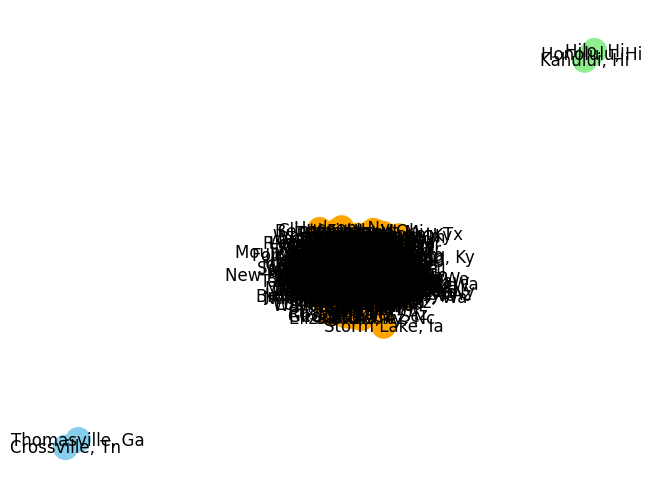

In [16]:
# plot all the communities (coloured differently)

color_map = []

for node in G:
    if node in communities[0]:
        color_map.append('orange')
    elif node in communities[1]:
        color_map.append('lightgreen')
    else:
        color_map.append('skyblue')

nx.draw(G, node_color=color_map, with_labels=True)
plt.show()

##### **First Community**

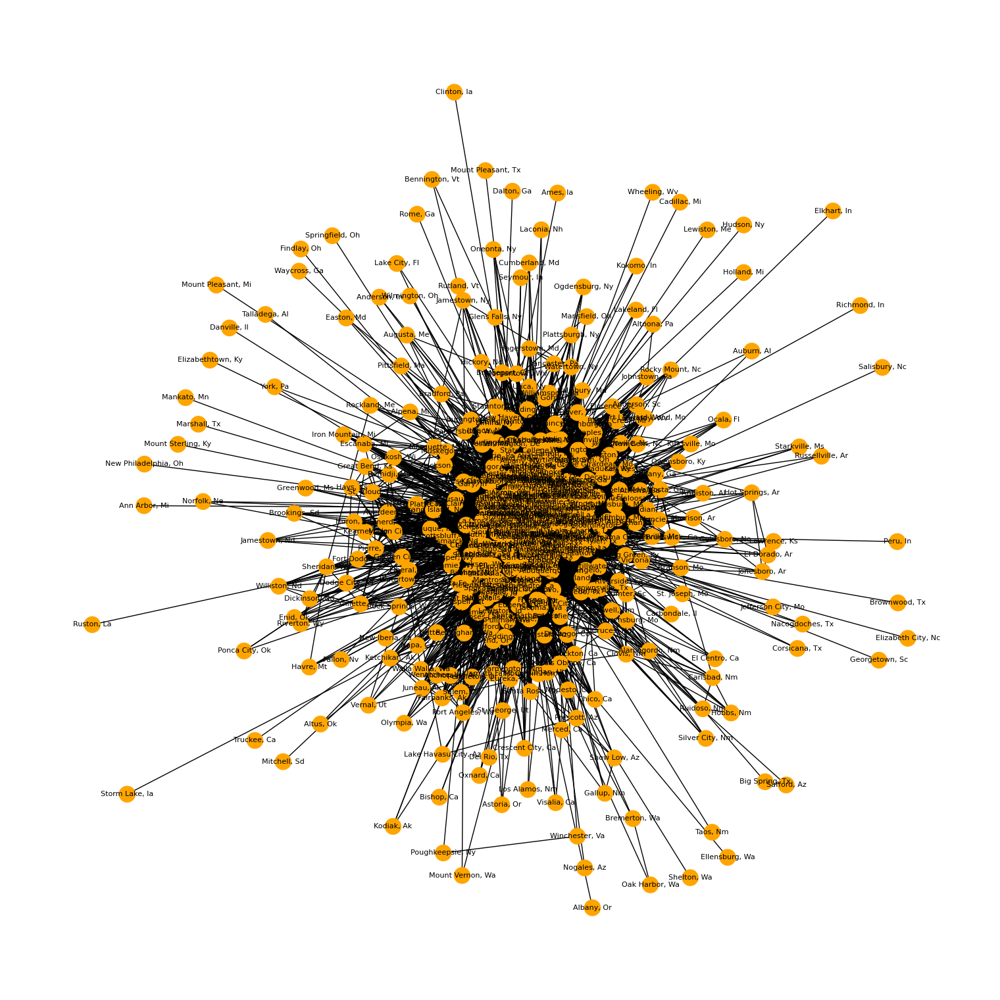

In [17]:
# create a subgraph for the first component
subgraph = G.subgraph(communities[0])

# sets the color of the nodes
color_map = ['orange' for _ in subgraph.nodes()]

# plots the subgraph
plt.figure(figsize=(15, 15))
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

##### **Second Community**

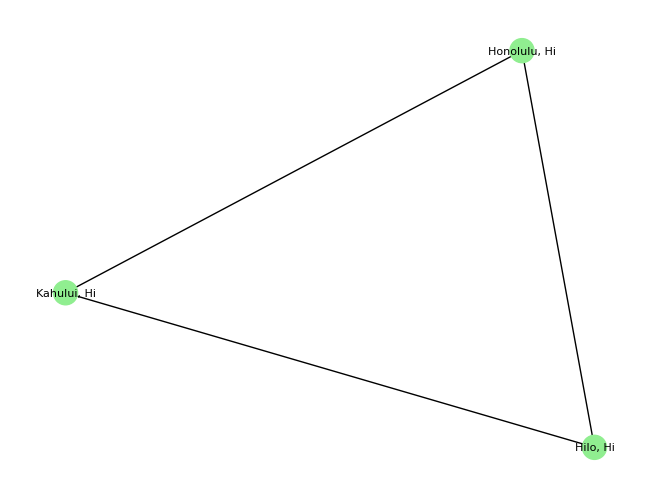

In [18]:
# create a subgraph for the second component
subgraph = G.subgraph(communities[1])

# sets the color of the nodes
color_map = ['lightgreen' for _ in subgraph.nodes()]

# plots the subgraph
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

##### **Third Community**

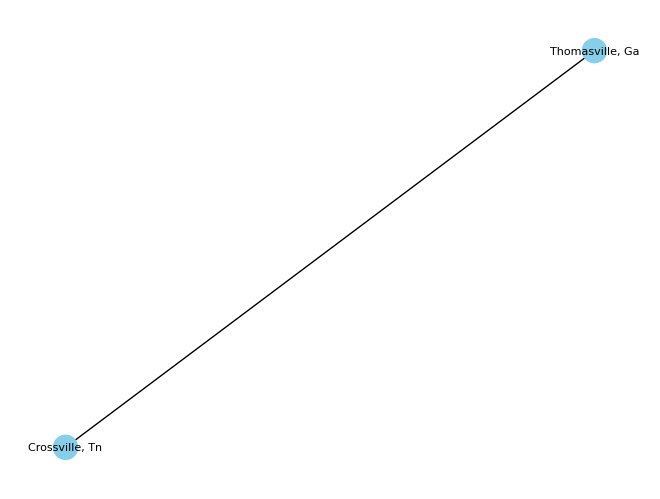

In [19]:
# create a subgraph for the third component
subgraph = G.subgraph(communities[2])

# sets the color of the nodes
color_map = ['skyblue' for _ in subgraph.nodes()]

# plots the subgraph
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

### **5.2. Alternative algorithm suggested by an LLM (Label Propagation Algorithm)**

Is a semi-supervised machine learning algorithm that assigns labels to previously unlabeled data points. At the start of the algorithm, a (generally small) subset of the data points have labels (or classifications). <br>
Each node “propagates” into the community with which it has the most connections. <br>
It's particularly valued for its speed and scalability, making it suitable for large networks.

#### **Main Steps**

**1. Initialization:** 
	
	Assign each node a unique label (e.g., its own node ID). This label represents the initial community of the node.

**2. Iterative Label Update (Propagation):**

    For each node, check the labels of its neighbors.
    Update the node's label to the most frequent label among its neighbors.
    If there's a tie in the most frequent labels, pick one randomly.

**3. Convergence:**

    Repeat step 2 until no labels change during an iteration (or a maximum number of iterations is reached).

**4. Community Extraction:**

    After convergence, nodes with the same label belong to the same community.

#### **Python Implementation**

In [5]:
from functions.q5_2 import *

In [6]:
def community_detection_2(graph, c1, c2):

	node_groups = []
	same_group = False
	x = label_propagation(graph)

	for i in x:
		node_groups.append(list(i))

	for group in node_groups:
		if c1 in group and c2 in group:
			same_group = True
     
	return node_groups, len(node_groups), same_group

#### **Results**

In [12]:
city_1 = 'Honolulu, Hi'
city_2 = 'Hilo, Hi'

result = community_detection_2(G.copy(), city_1, city_2)
communities = result[0]
print(f"The total number of communities is {result[1]}\n")

if result[2]:
    print(f"{city_1} and {city_2} are in the same community!\n")
else:
    print(f"{city_1} and {city_2} are NOT in the same community..\n")

for community in communities:
    print(community)

The total number of communities is 4

Honolulu, Hi and Hilo, Hi are in the same community!

['Manhattan, Ks', 'Ames, Ia', 'Eugene, Or', 'Bend, Or', 'Seattle, Wa', 'Portland, Or', 'Klamath Falls, Or', 'San Francisco, Ca', 'Los Angeles, Ca', 'Wenatchee, Wa', 'Yakima, Wa', 'Elko, Nv', 'Salem, Or', 'Spokane, Wa', 'Lewiston, Id', 'Astoria, Or', 'Port Angeles, Wa', 'Pendleton, Or', 'San Jose, Ca', 'Eureka, Ca', 'Pullman, Wa', 'Sacramento, Ca', 'Phoenix, Az', 'Longview, Tx', 'Fresno, Ca', 'Moses Lake, Wa', 'Billings, Mt', 'Salt Lake City, Ut', 'Casper, Wy', 'Reno, Nv', 'Fairbanks, Ak', 'Anchorage, Ak', 'Santa Fe, Nm', 'Albuquerque, Nm', 'Fort Smith, Ar', 'Las Vegas, Nv', 'Wichita, Ks', 'Duluth, Mn', 'Oklahoma City, Ok', 'San Diego, Ca', 'Santa Rosa, Ca', 'Oakland, Ca', 'Houston, Tx', 'El Paso, Tx', 'Dubuque, Ia', 'Helena, Mt', 'Dallas, Tx', 'Tulsa, Ok', 'Omaha, Ne', 'Waco, Tx', 'Butte, Mt', 'Austin, Tx', 'Peoria, Il', 'Wausau, Wi', 'Tucson, Az', 'Pueblo, Co', 'Topeka, Ks', 'Colorado Springs, 

##### **Compute and plot all the communities together**

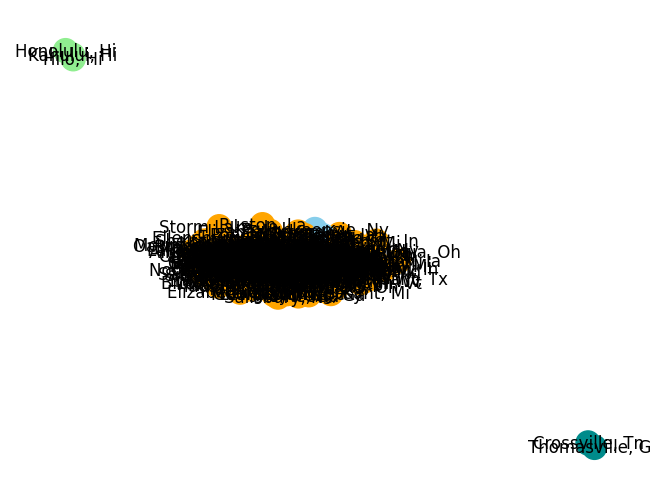

In [13]:
# plot all the communities (coloured differently)

color_map_2 = []

for node in G:
    if node in communities[0]:
        color_map_2.append('orange')
    elif node in communities[1]:
        color_map_2.append('lightgreen')
    elif node in communities[2]:
        color_map_2.append('skyblue')
    else:
        color_map_2.append('darkcyan')

nx.draw(G, node_color=color_map_2, with_labels=True)
plt.show()

##### **First Community**

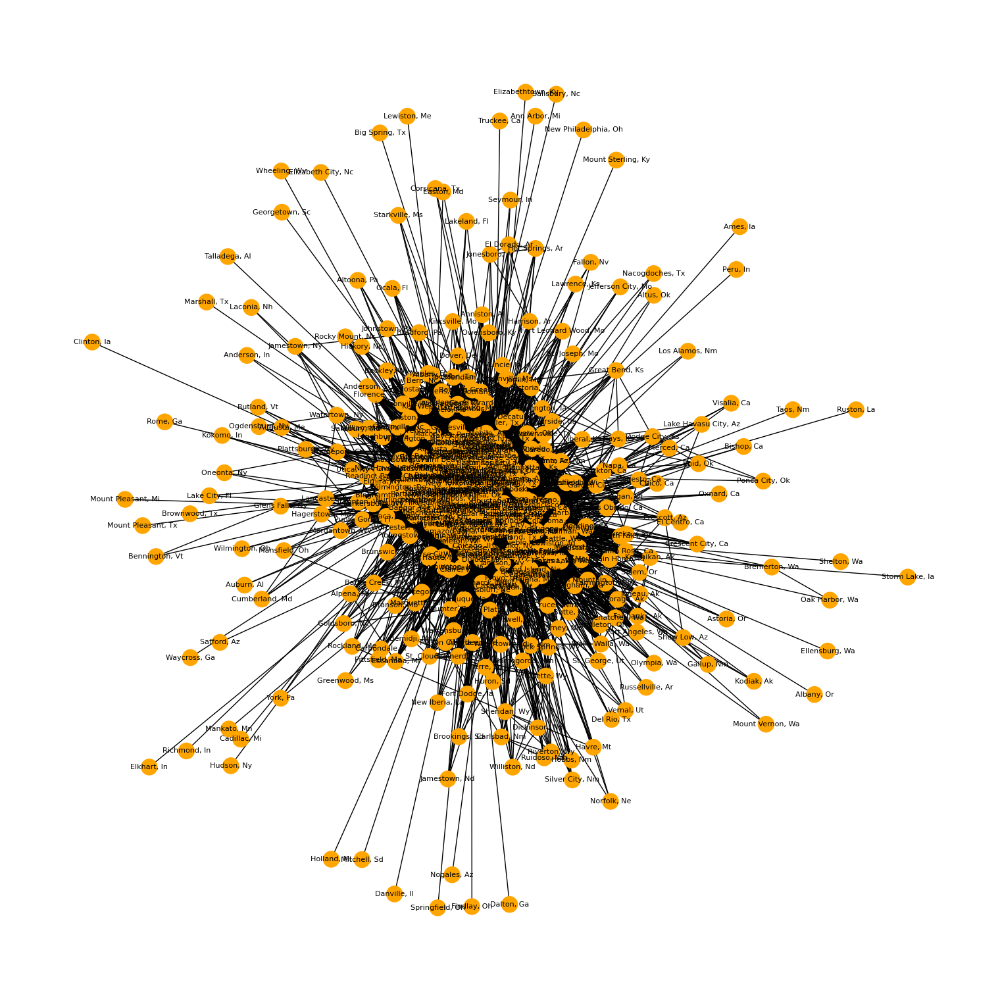

In [14]:
# create a subgraph for the first component
subgraph = G.subgraph(communities[0])

# sets the color of the nodes
color_map = ['orange' for _ in subgraph.nodes()]

# plots the subgraph
plt.figure(figsize=(15, 15))
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

##### **Second Community**

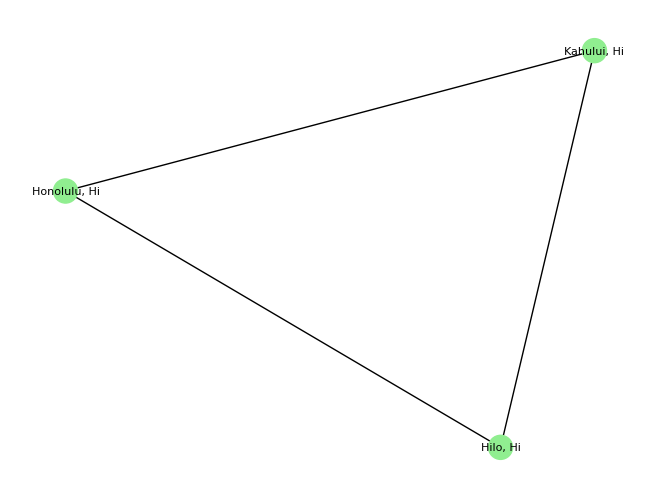

In [15]:
# create a subgraph for the second component
subgraph = G.subgraph(communities[1])

# sets the color of the nodes
color_map = ['lightgreen' for _ in subgraph.nodes()]

# plots the subgraph
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

##### **Third Community**

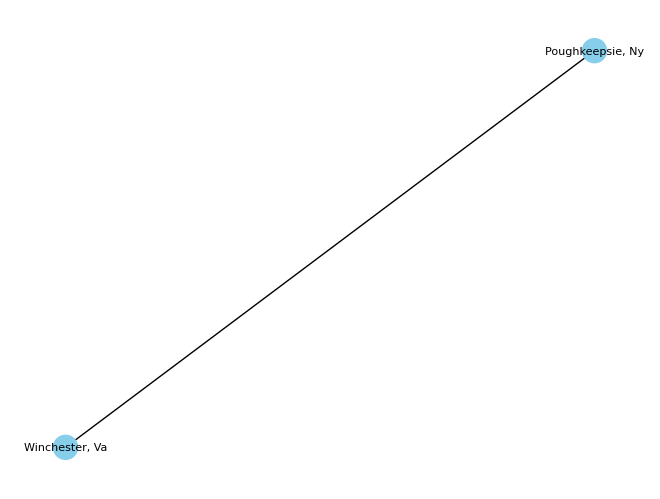

In [16]:
# create a subgraph for the third component
subgraph = G.subgraph(communities[2])

# sets the color of the nodes
color_map = ['skyblue' for _ in subgraph.nodes()]

# plots the subgraph
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

##### **Fourth Community**

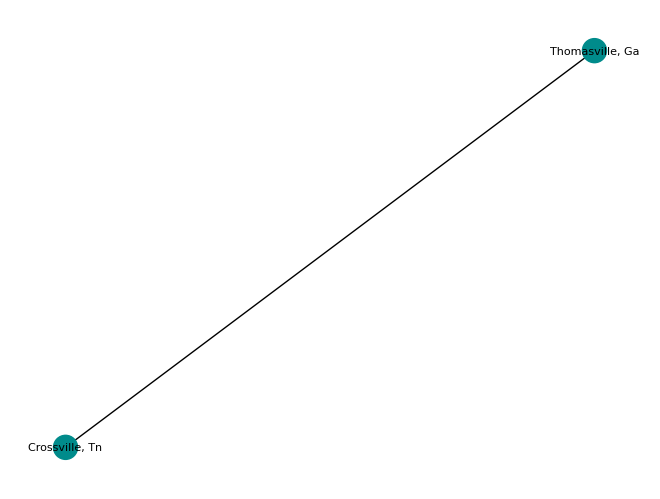

In [18]:
# create a subgraph for the fourth component
subgraph = G.subgraph(communities[3])

# sets the color of the nodes
color_map = ['darkcyan' for _ in subgraph.nodes()]

# plots the subgraph
nx.draw(subgraph, node_color=color_map, with_labels=True, node_size=300, font_size=8)
plt.show()

#### **Final Comparison**

##### **Differences between Girvan-Newman and Label Propagation**

**Girvan-Newman:**
- **Based on edge betweenness:** It identifies communities by iteratively removing the most "central" edges (those connecting multiple communities). It's computationally intensive and slow (as it recalculates edge betweenness repeatedly), making it suitable for smaller graphs.
- **Approach:** It divides the graph based on its global structure and is more likely to find larger, well-connected communities.
- **Results:** Given the same graph, it will always produce the same result.

**Label Propagation:**
- **Based on local dynamics:** It assigns labels to nodes and propagates these labels based on their neighbors. It doesn't rely on a global measure of graph "division" so is faster, more scalable and more suitable for largest graphs.
- **Approach:** It is sensitive to the local structure and can sometimes produce more communities, especially if there are smaller groups of nodes weakly connected to others.
- **Results:** The algorithm can yield slightly different results on each run, particularly if the order of node updates is not fixed.

**Number of communities:**<br>
In our case, as shown previously, girvan-newman found 3 communities while label propagation 4. This may be given by the different nature of the two algorithms where
- **Girvan-Newman** may stop at a division that optimizes a specific metric (e.g. modularity), thus identifying fewer communities.
- **Label Propagation**, being based on local propagation, may detect smaller or weakly connected substructures, with consequently, higher chances of finding more of them.

##### **Conclusions about the two approaches (which is better?)**

The goodness of either algorithm depends on the size of the graph and in our case certainly the graph cannot be considered small so in my opinion, as being more scalable and faster, the best algorithm is the one proposed by LLM i.e. Label Propagation (although Girvan-Newman is potentially more accurate). Probably an ideal approach would include the use of both algorithms: the Label Propagation for a fast solution and the Girvan-Newman for possibly confirming or deepening the results obtained.

## **Bonus Question - Connected Components on MapReduce**

## **Algorithmic Question (AQ)**